Prvo ću da očitam pakete koji će mi biti potrebni.

In [1]:
#install.packages("colorspace") 
#install.packages("ggpubr")
#install.packages("gridExtra")
#install.packages("waffle")
#install.packages("ggplot2")
#install.packages("igraph")
#install.packages("dplyr")
#install.packages("magrittr")
#install.packages("tidyr")
#install.packages("car")
#install.packages("plyr")
#install.packages("plotly")

In [3]:
library(ggplot2)
library(waffle)
library(gridExtra)
library(tidyr)
library(igraph)
#Ovaj paket omogucava da se napravi pajp line
library(magrittr)
library("plyr")
library(dplyr)
library(car)
library(ggpubr)
library(plotly)


In [4]:
getwd()

[1] "C:/Users/Elvira/Desktop/AIV1"

Baze podataka koje ću koristiti preuzela sam sa sajta kaggle.com, tačnije mogu se pronaći na sledećem linku: https://www.kaggle.com/uciml/student-alcohol-consumption
Ovaj dataset se bavi učeničkim postignućima u dve Portugalske škole :
- ''Gabriel Pereira''(GS) i  
- ''Mousinho da Silveira''(MS).
U dosadašnjim istraživanjima utvrđeno je da prethodne školske ocene imaju mnogo veći uticaj na postignuća od demografskih promenljivih, nešto slično su zaključili i u istraživanju čije podatke koristim.
Podaci su prikupljeni tokom školske godine 2005/2006. iz ove dve javne(državne) škole, iz regije Alentejo u Portugalu.
Iako je postojao trend  povećanja ulaganja u informacione tehnologije od vlade, većina portugalskih IS u javnim školama je tada bilo vrlo loše, oslanjali su se uglavnom na ručno pisane forme, što je takođe bio slučaj kad je rađeno istraživanje u ove dve škole.
Dakle, baza podataka je formirana na osnovu dva izvora: 
1.školskih izveštaja na papiru, koji uključuju samo mali broj atributa.(ocene iz tri perioda i broj izostanaka iz škole);
2. upitnika koji su korišćeni za dopunu prethodnih informacija.
Dizajnirali su upitnike sa zatvorenim pitanjima (tj. sa unapred definisanim opcijama) koja se odnose na nekoliko:
- demografskih (npr. obrazovanje majke),
- socijalno / emocionalnih (npr. konzumiranje alkohola, kvalitet odnosa u porodici) 
- i sa školom povezanih varijabli (npr. koliko je puta učenik u prošlosti pao odredjeni predmet) za koje se očekivalo da će uticati na konačne rezultate(ocene) učenika. 
Upitnik su pregledali školski profesionalci i testirali ga na malom uzorku od 15 učenika kako bi dobili povratne informacije. Konačna verzija sadržala je 37 pitanja na A4 formatu, a na to je odgovorilo 788 učenika. Posle je 111 odgovora  odbačeno zbog nedostatka indetifikacionih podataka (neophodnih za spajanje sa školskim izveštajima).
Konačno, podaci su integrisani u dva skupa podataka koje se odnose na časove matematike (sa 395 učenika) i portugalskog jezika (649 učenika). 
Sada ći navesti atribute(varijable) za obe baze student-mat.csv (Math course) i student-por.csv (Portuguese language course)
(Opis datih atributa ostaviću na engleskom jeziku, jer su nazivi kolona uskladjeni upravo sa engleskim termininama):
1. school - student's school (binary: 'GP' - Gabriel Pereira or 'MS' - Mousinho da Silveira)
2. sex - student's sex (binary: 'F' - female or 'M' - male)
3. age - student's age (numeric: from 15 to 22)
4. address - student's home address type (binary: 'U' - urban or 'R' - rural)
5. famsize - family size (binary: 'LE3' - less or equal to 3 or 'GT3' - greater than 3)
6. Pstatus - parent's cohabitation status (binary: 'T' - living together or 'A' - apart)
7. Medu - mother's education (numeric: 0 - none, 1 - primary education (4th grade), 2 - 5th to 9th grade, 3 - secondary education or 4 - higher education)
9. Mjob - mother's job (nominal: 'teacher', 'health' care related, civil 'services' (e.g. administrative or police), 'at_home' or 'other')
10. Fjob - father's job (nominal: 'teacher', 'health' care related, civil 'services' (e.g. administrative or police), 'at_home' or 'other')
11. reason - reason to choose this school (nominal: close to 'home', school 'reputation', 'course' preference or 'other')
12. guardian - student's guardian (nominal: 'mother', 'father' or 'other')
13. traveltime - home to school travel time (numeric: 1 - <15 min., 2 - 15 to 30 min., 3 - 30 min. to 1 hour, or 4 - >1 hour)
14. studytime - weekly study time (numeric: 1 - <2 hours, 2 - 2 to 5 hours, 3 - 5 to 10 hours, or 4 - >10 hours)
15. failures - number of past class failures (numeric: n if 1<=n<3, else 4)
16. schoolsup - extra educational support (binary: yes or no)
17. famsup - family educational support (binary: yes or no)
18. paid - extra paid classes within the course subject (Math or Portuguese) (binary: yes or no)
19. activities - extra-curricular activities (binary: yes or no)
20. nursery - attended nursery school (binary: yes or no)
21. higher - wants to take higher education (binary: yes or no)
22. internet - Internet access at home (binary: yes or no)
23. romantic - with a romantic relationship (binary: yes or no)
24. famrel - quality of family relationships (numeric: from 1 - very bad to 5 - excellent)
25. freetime - free time after school (numeric: from 1 - very low to 5 - very high)
26. goout - going out with friends (numeric: from 1 - very low to 5 - very high)
27. Dalc - workday alcohol consumption (numeric: from 1 - very low to 5 - very high)
28. Walc - weekend alcohol consumption (numeric: from 1 - very low to 5 - very high)
29. health - current health status (numeric: from 1 - very bad to 5 - very good)
30. absences - number of school absences (numeric: from 0 to 93)

Ocene se odnose na Matematiku ili Portugalski jezik u zavisnosti od baze:

31. G1 - first period grade (numeric: from 0 to 20)

32. G2 - second period grade (numeric: from 0 to 20)

33. G3 - final grade (numeric: from 0 to 20, output target)

Citation Request:
Please include this citation if you plan to use this database:
P. Cortez and A. Silva. Using Data Mining to Predict Secondary School Student Performance.In A.Brito and J. Teixeira Eds.,Proceedings of 5th FUture BUsiness TEChnology Conference (FUBUTEC 2008)pp.5-12, Porto, Portugal, April, 2008, EUROSIS, ISBN 978-9077381-39-7. http://www3.dsi.uminho.pt/pcortez/student.pdf

 

In [79]:
sm<-read.csv("C:/Users/Elvira/Desktop/AIV1/student-mat.csv",
             header = TRUE,
             sep = ',',
             stringsAsFactors = TRUE)
is.data.frame(sm)
head(sm)
tail(sm)

[1] TRUE

school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,...,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
GP,F,18,U,GT3,A,4,4,at_home,teacher,...,4,3,4,1,1,3,6,5,6,6
GP,F,17,U,GT3,T,1,1,at_home,other,...,5,3,3,1,1,3,4,5,5,6
GP,F,15,U,LE3,T,1,1,at_home,other,...,4,3,2,2,3,3,10,7,8,10
GP,F,15,U,GT3,T,4,2,health,services,...,3,2,2,1,1,5,2,15,14,15
GP,F,16,U,GT3,T,3,3,other,other,...,4,3,2,1,2,5,4,6,10,10
GP,M,16,U,LE3,T,4,3,services,other,...,5,4,2,1,2,5,10,15,15,15


,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,...,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
390,MS,F,18,U,GT3,T,1,1,other,other,...,1,1,1,1,1,5,0,6,5,0
391,MS,M,20,U,LE3,A,2,2,services,services,...,5,5,4,4,5,4,11,9,9,9
392,MS,M,17,U,LE3,T,3,1,services,services,...,2,4,5,3,4,2,3,14,16,16
393,MS,M,21,R,GT3,T,1,1,other,other,...,5,5,3,3,3,3,3,10,8,7
394,MS,M,18,R,LE3,T,3,2,services,other,...,4,4,1,3,4,5,0,11,12,10
395,MS,M,19,U,LE3,T,1,1,other,at_home,...,3,2,3,3,3,5,5,8,9,9


Na osnovu prvih 6 i poslednjih 6 kolona možemo da steknemo *prvi uvid u bazu* podataka koju ću koristiti, možemo primetiti i da je u obliku "data frame".

In [5]:
apply(sm, 2, unique)

$school
[1] "GP" "MS"

$sex
[1] "F" "M"

$age
[1] "18" "17" "15" "16" "19" "22" "20" "21"

$address
[1] "U" "R"

$famsize
[1] "GT3" "LE3"

$Pstatus
[1] "A" "T"

$Medu
[1] "4" "1" "3" "2" "0"

$Fedu
[1] "4" "1" "2" "3" "0"

$Mjob
[1] "at_home"  "health"   "other"    "services" "teacher" 

$Fjob
[1] "teacher"  "other"    "services" "health"   "at_home" 

$reason
[1] "course"     "other"      "home"       "reputation"

$guardian
[1] "mother" "father" "other" 

$traveltime
[1] "2" "1" "3" "4"

$studytime
[1] "2" "3" "1" "4"

$failures
[1] "0" "3" "2" "1"

$schoolsup
[1] "yes" "no" 

$famsup
[1] "no"  "yes"

$paid
[1] "no"  "yes"

$activities
[1] "no"  "yes"

$nursery
[1] "yes" "no" 

$higher
[1] "yes" "no" 

$internet
[1] "no"  "yes"

$romantic
[1] "no"  "yes"

$famrel
[1] "4" "5" "3" "1" "2"

$freetime
[1] "3" "2" "4" "1" "5"

$goout
[1] "4" "3" "2" "1" "5"

$Dalc
[1] "1" "2" "5" "3" "4"

$Walc
[1] "1" "3" "2" "4" "5"

$health
[1] "3" "5" "1" "2" "4"

$absences
 [1] " 6" " 4" "10" " 2" " 0" "16" "14" " 7" " 8" "25" "12" "54" "18" "26" "20"
[16] "56" "24" "28" " 5" "13" "15" "22" " 3" "21" " 1" "75" "30" "19" " 9" "11"
[31] "38" "40" "23" "17"

$G1
 [1] " 5" " 7" "15" " 6" "12" "16" "14" "10" "13" " 8" "11" " 9" "17" "19" "18"
[16] " 4" " 3"

$G2
 [1] " 6" " 5" " 8" "14" "10" "15" "12" "18" "16" "13" " 9" "11" " 7" "19" "17"
[16] " 4" " 0"

$G3
 [1] " 6" "10" "15" "11" "19" " 9" "12" "14" "16" " 5" " 8" "17" "18" "13" "20"
[16] " 7" " 0" " 4"

- Ova funkcija mi se učinila vrlo korisna kako bi stekli uvid u **sve varjable** i koje su njihove **jedinstvene vrednosti** na nivou celog dataseta.

In [6]:
dim(sm)

[1] 395  33

Vidimo da su dimenziije 395x33

- Imamo 33 varijable, poslednje 3 su ocene iz 3 perioda.

- Imamo 395 ispitanika iz dve škole.

In [7]:
sum(apply(sm, 2, is.na))

[1] 0

- Nemamo nedostajućih **(NA)** vrednosti.

In [8]:
str(sm)

'data.frame':	395 obs. of  33 variables:
 $ school    : Factor w/ 2 levels "GP","MS": 1 1 1 1 1 1 1 1 1 1 ...
 $ sex       : Factor w/ 2 levels "F","M": 1 1 1 1 1 2 2 1 2 2 ...
 $ age       : int  18 17 15 15 16 16 16 17 15 15 ...
 $ address   : Factor w/ 2 levels "R","U": 2 2 2 2 2 2 2 2 2 2 ...
 $ famsize   : Factor w/ 2 levels "GT3","LE3": 1 1 2 1 1 2 2 1 2 1 ...
 $ Pstatus   : Factor w/ 2 levels "A","T": 1 2 2 2 2 2 2 1 1 2 ...
 $ Medu      : int  4 1 1 4 3 4 2 4 3 3 ...
 $ Fedu      : int  4 1 1 2 3 3 2 4 2 4 ...
 $ Mjob      : Factor w/ 5 levels "at_home","health",..: 1 1 1 2 3 4 3 3 4 3 ...
 $ Fjob      : Factor w/ 5 levels "at_home","health",..: 5 3 3 4 3 3 3 5 3 3 ...
 $ reason    : Factor w/ 4 levels "course","home",..: 1 1 3 2 2 4 2 2 2 2 ...
 $ guardian  : Factor w/ 3 levels "father","mother",..: 2 1 2 2 1 2 2 2 2 2 ...
 $ traveltime: int  2 1 1 1 1 1 1 2 1 1 ...
 $ studytime : int  2 2 2 3 2 2 2 2 2 2 ...
 $ failures  : int  0 0 3 0 0 0 0 0 0 0 ...
 $ schoolsup : Factor w/

Pomoću funkcije srt() osim što vidimo da imamo data frame, njegove dimnezije, varijable, možemo da se upoznamo i sa tipom podataka za svaku varijablu, tj. barem kako smo mi očitali podatke.

Na osnovu toga možemo da vidimo da li za određene varijable treba da promenimo tip.

Zasada je sve u dobrom obliku, doćiće do nekih dodatnih sređivanja pre samih vizuelizacija koje planiram da prikažem.

Pre nego što krenem da se bavim detaljnijom analizom i postavim istraživačka pitanja želim da se bliže upoznam sa datasetom koji koristim.
Za početak želim da vidim da li je odnos dečaka i devojčica u uzorku usklađen?
Kakav je raspon starosti medju učenicima? itd.


In [9]:
table(sm$sex)


  F   M 
208 187 

In [10]:
colors ＜- c("orange","blue")
colors

[1] "orange" "blue"

In [11]:
df <- data.frame(gender_group = c("Male", "Female"),
                        count =c(187,208),
             percentage_value = c(47.34, 52.65))
df

gender_group,count,percentage_value
Male,187,47.34
Female,208,52.65


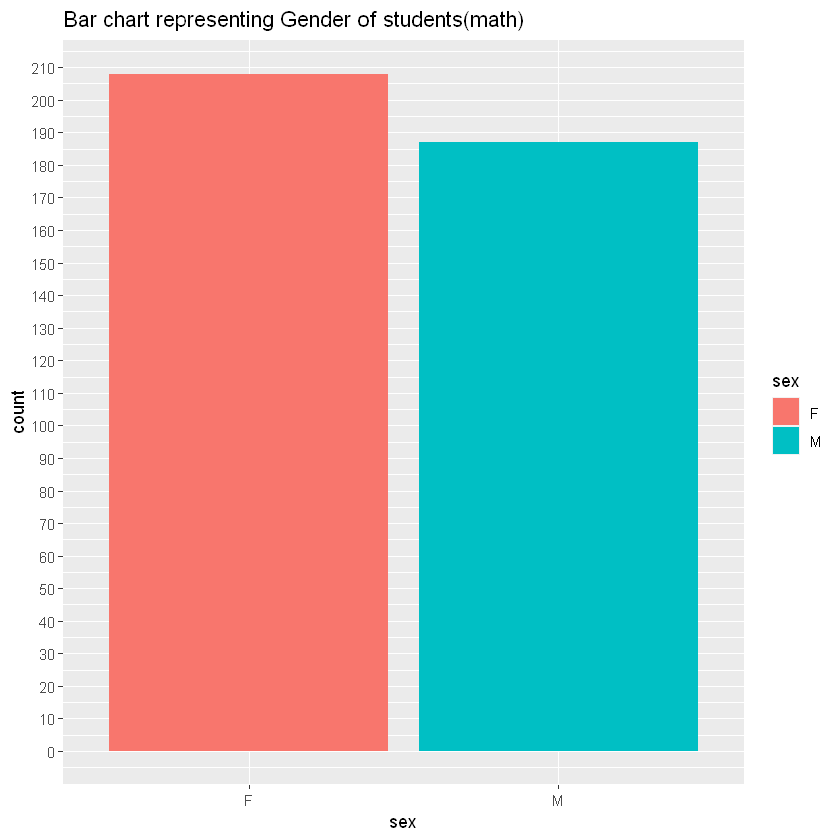

In [13]:

sss<-ggplot(sm, aes(x=sex)) + 
  geom_bar(stat = "count",
                 aes(fill = sex))+
  scale_y_continuous(breaks = seq(0,210,10))+
  ggtitle("Bar chart representing Gender of students(math)")

sss

In [14]:
table(sm$higher)
higbar<-ggplot(sm, aes(x=higher)) + 
  geom_bar(stat = "count",
                 aes(fill = higher))+
  scale_y_continuous(breaks = seq(0,380,20))+
  ggtitle("Bar chart representing desire for higher education of students(mat)")


 no yes 
 20 375 


 no yes 
194 201 

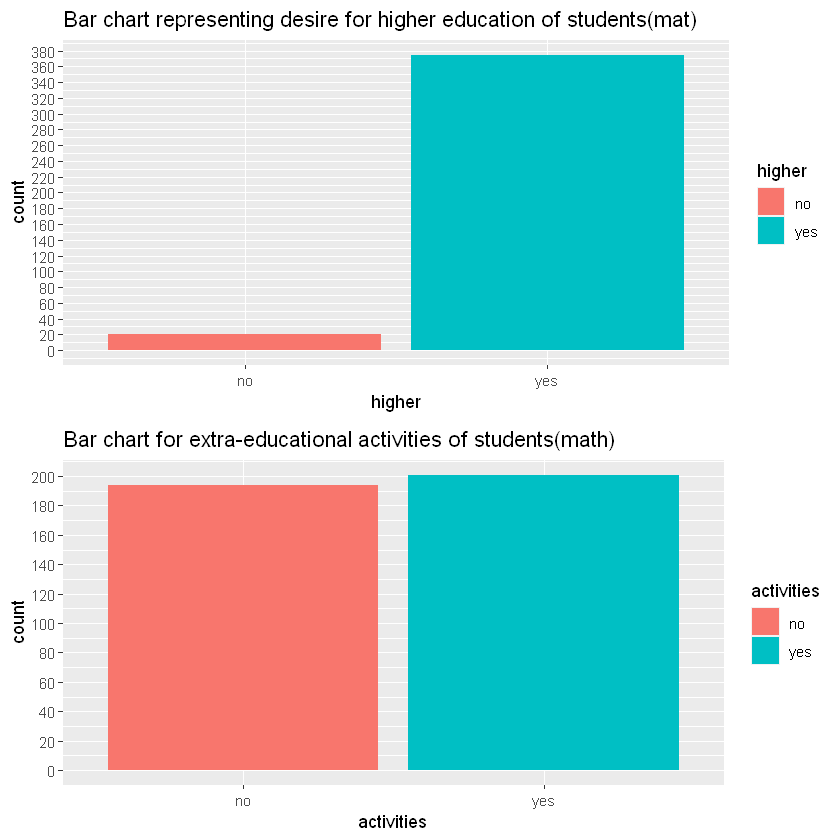

In [15]:
table(sm$activities)
act<-ggplot(sm, aes(x=activities)) + 
  geom_bar(stat = "count",
                 aes(fill = activities))+
  scale_y_continuous(breaks = seq(0,210,20))+
  ggtitle("Bar chart for extra-educational activities of students(math)")
grid.arrange(higbar,act,nrow=2)

In [16]:
table(sm$address)
adres<-ggplot(sm, aes(x=address)) + 
  geom_bar(stat = "count",
                 aes(fill = address))+
  scale_y_continuous(breaks = seq(0,310,20))+
  ggtitle("Bar chart for Adress of students(math)\
                    Urban/Rural")



  R   U 
 88 307 


 no yes 
263 132 

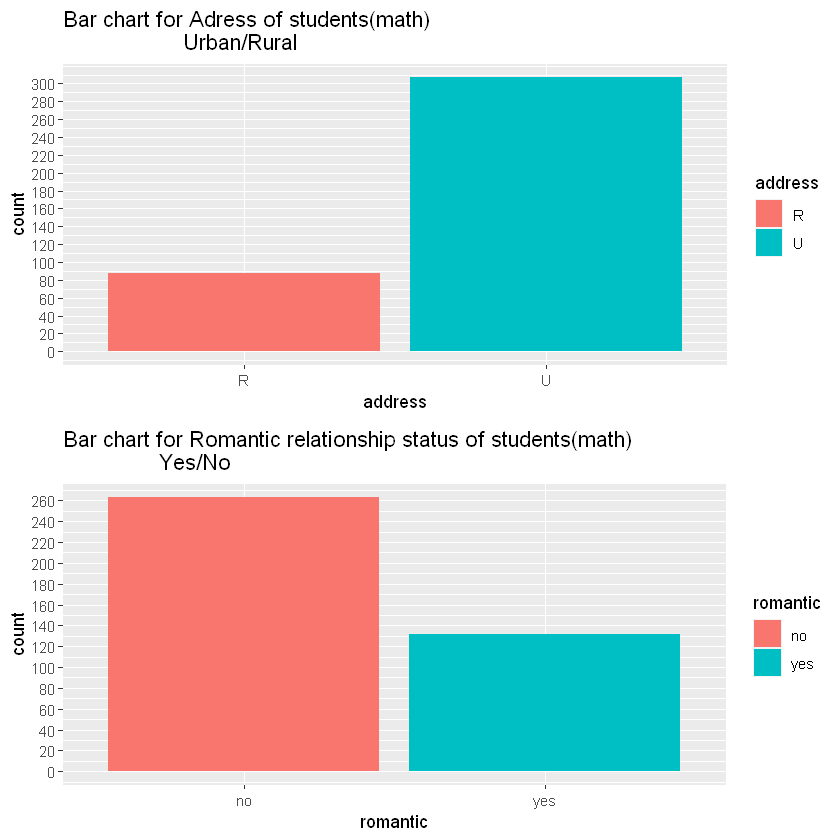

In [17]:
table(sm$romantic)
r<-ggplot(sm, aes(x=romantic)) + 
  geom_bar(stat = "count",
                 aes(fill = romantic))+
  scale_y_continuous(breaks = seq(0,265,20))+
  ggtitle("Bar chart for Romantic relationship status of students(math)\
                Yes/No")
grid.arrange(adres,r,nrow=2)

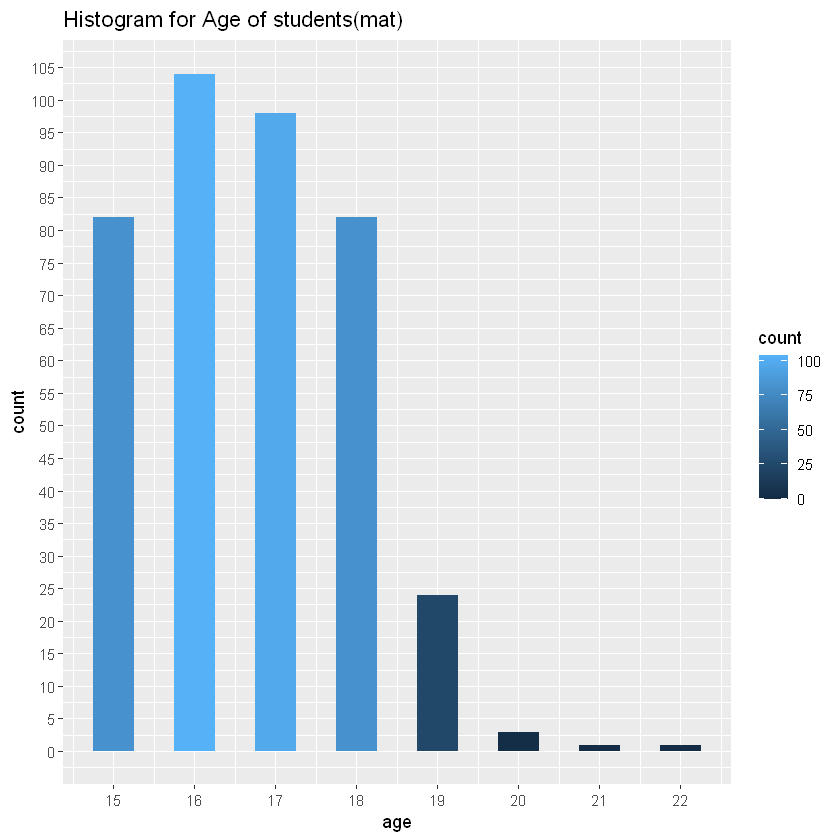

In [18]:

a<-ggplot(sm, aes(x=age)) + 
  geom_histogram(binwidth = 0.5, aes(fill = ..count..))+
  scale_y_continuous(breaks = seq(0,105,5))+
  scale_x_continuous(breaks = seq(0,22,1))+
  ggtitle("Histogram for Age of students(mat)")
a



In [19]:

table(sm$paid)
pcp<-ggplot(sm, aes(x=paid)) + 
  geom_bar(stat = "count",
                 aes(fill = paid))+
  scale_y_continuous(breaks = seq(0,380,10))+
  ggtitle("Bar chart representing Paid clases of math for students(mat)")


 no yes 
214 181 


 GP  MS 
349  46 

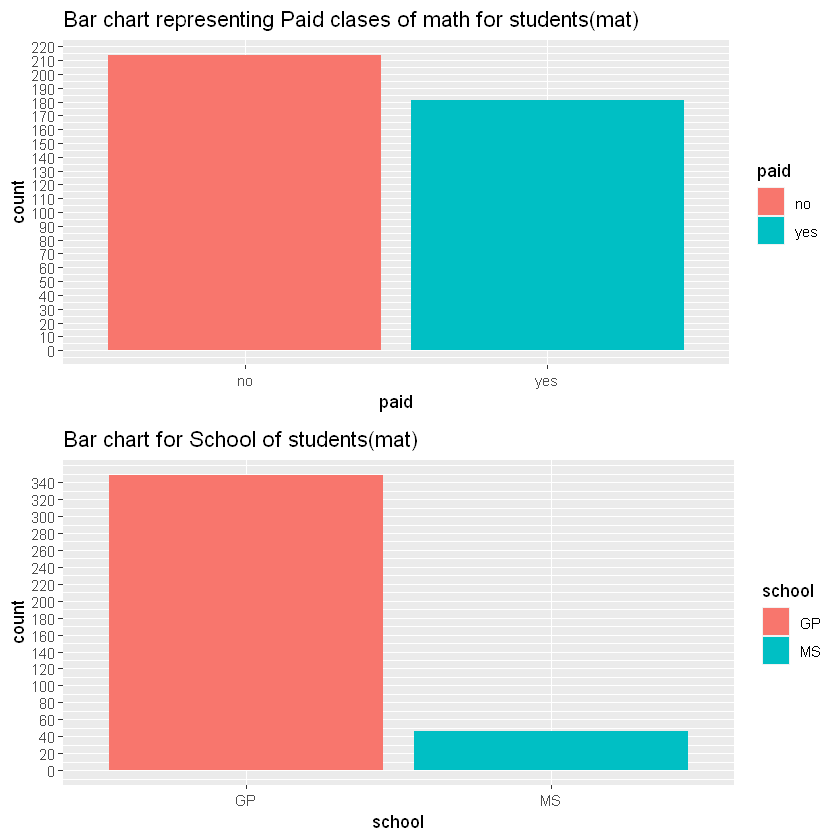

In [20]:
table(sm$school)
schp<-ggplot(sm, aes(school)) + 
  geom_bar(stat = "count",
                 aes(fill = school))+
  scale_y_continuous(breaks = seq(0,350,20))+
  ggtitle("Bar chart for School of students(mat)")
grid.arrange(pcp,schp, nrow=2)


 no yes 
153 242 

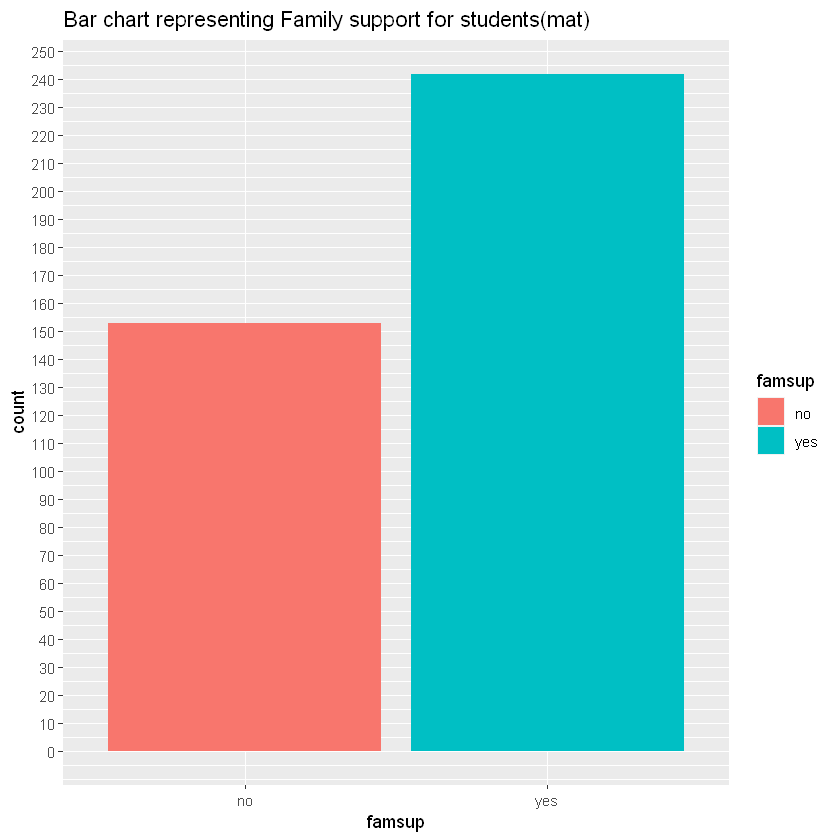

In [21]:
table(sm$famsup)
famsg<-ggplot(sm, aes(x=famsup)) + 
  geom_bar(stat = "count",
                 aes(fill = famsup))+
  scale_y_continuous(breaks = seq(0,380,10))+
  ggtitle("Bar chart representing Family support for students(mat)")
famsg


 no yes 
344  51 

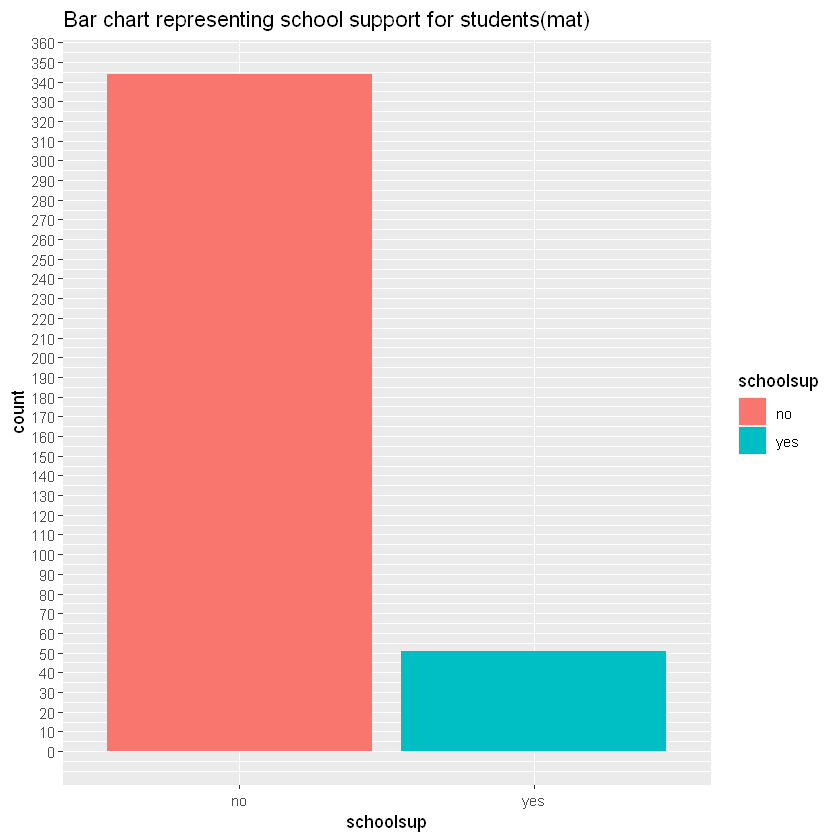

In [22]:
table(sm$schoolsup)
schsug<-ggplot(sm, aes(x=schoolsup)) + 
  geom_bar(stat = "count",
                 aes(fill = schoolsup))+
  scale_y_continuous(breaks = seq(0,380,10))+
  ggtitle("Bar chart representing school support for students(mat)")
schsug


GT3 LE3 
281 114 

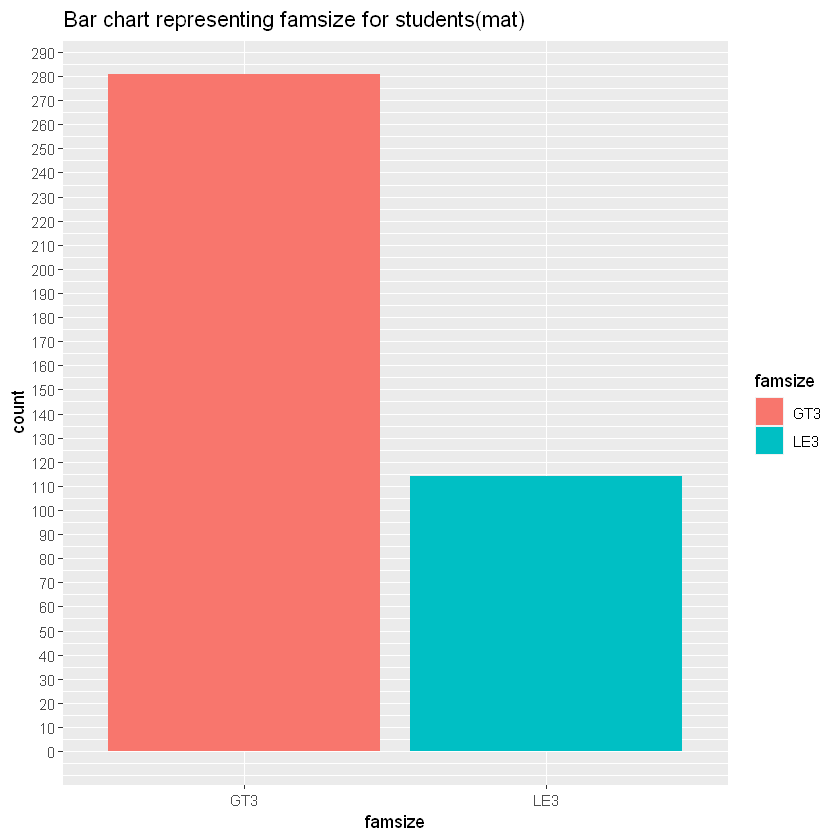

In [23]:
table(sm$famsize)
famsg<-ggplot(sm, aes(x=famsize)) + 
  geom_bar(stat = "count",
                 aes(fill = famsize))+
  scale_y_continuous(breaks = seq(0,380,10))+
  ggtitle("Bar chart representing famsize for students(mat)")
famsg


 no yes 
 81 314 

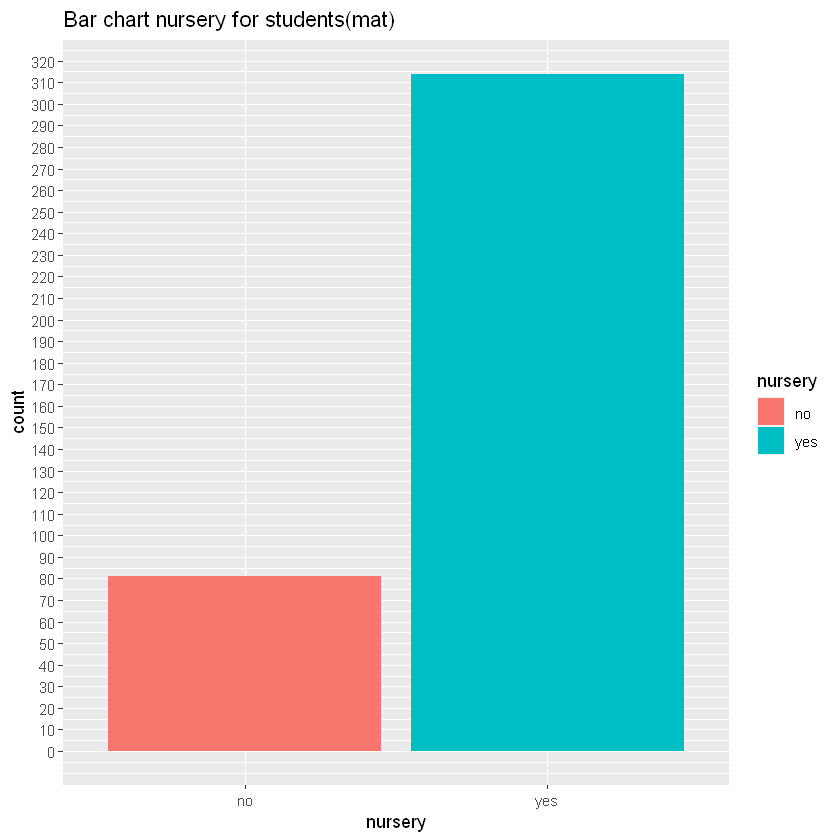

In [24]:
table(sm$nursery)
nursg<-ggplot(sm, aes(x=nursery)) + 
  geom_bar(stat = "count",
                 aes(fill = nursery))+
  scale_y_continuous(breaks = seq(0,380,10))+
  ggtitle("Bar chart nursery for students(mat)")
nursg


1 - Mogu da primetim da je odnos **dečaka i devojčica** dovoljno *usklađen*
- M = 187(47.3%),
- F = 208(52.7%).

2 - Odnos učenik u **romantičnoj vezi** i onih koji nisu u vezi je neusklađen (no: 263, yes: 132) 

3 - Odnos učenika koji pohađaju **vannastavne aktivnosti** i onih koji ih ne pohađaju je *vrlo uravnotežen* (no: 194, yes: 201)

4 - Odnos učenika koji **ne žele** i **žele da nastave svoje obrazovanje** je potpuno neusklađen (no:20,yes:375), međutim vrlo je pozitivno što apsolutna većina želi da nastavi školovanje i planira da ide na fakultet.

5 - Odnos učenika iz **urbanih i ruralnih** sredina je takođe neusklađen  i to vrlo izraženo(R: 88,U: 307) 

6 - Što se tiče **starosti** učenika, dominantno su uzrasta od 15 do 18 godina, međutim manji broj postoji i u rasponu od 19 do 22 godine (19=24,20=3,21=1,22=1),niko nije stariji od 22 godine što je logično, s obzirom na to da su ovo učenici dve srednje škole u Portugalu.

7 - Poprilično je **usklađen odnos** između učenika koji idu na **dodatno plaćene** časove iz matematike i onih koji ne idu.(no: 214, yes: 181)

8 - Takođe većina učenika 349 je iz prve **škole** ''Gabriel Pereira''(GS)(u slučaju ovog dataseta koji se odnosi na ocene iz matematike), dok je 46 iz druge škole- ''Mousinho da Silveira''(MS)

9- Odnos onih koji su pohadjali i onih koji nisu pohadjali medicinsku školu je vrlo neusklađen, većina je pohađala(Yes:314, No:81)
10- Većina učenika živi u porodicama većim od tri člana (GT3:281, LE3:114)

11- Većina učenika nema dodatnu obrazovnu podršku(no:344, yes:51) 

12- Većina učenika ima dodatnu podršku roditelja u obrazovanju, međutim možemo da primetimo da je značajan i broj onih koji tu podršku nemaju, uzorak je u ovom slučaju negde na donjoj granici kada je u pitanju usklađenost onih koji imaju i nemaju podršku(famsup). (no:153, yes:242)

   
 

                    **Konzumacija alkohola - zanimljvosti kroz vizuelizacija**

In [25]:
alcohol.d <- as.data.frame(table(sm$Dalc))
alcohol.d
alcohol.d.1 <- as.numeric(alcohol.d$Freq)
alcohol.d.1
names(alcohol.d.1) <- alcohol.d$Var1
alcohol.d.1<- round(alcohol.d.1/10)
alcohol.d.1

Var1,Freq
1,276
2,75
3,26
4,9
5,9


[1] 276  75  26   9   9

1  2  3  4  5 
28  8  3  1  1

In [26]:
table(sm$Walc)
alcohol.w <- as.data.frame(table(sm$Walc))
alcohol.w
alcohol.w.1 <- as.numeric(alcohol.w$Freq)
alcohol.w.1
names(alcohol.w.1) <- alcohol.w$Var1
alcohol.w.1 <- round(alcohol.w.1/10)
alcohol.w.1


  1   2   3   4   5 
151  85  80  51  28 

Var1,Freq
1,151
2,85
3,80
4,51
5,28


[1] 151  85  80  51  28

1  2  3  4  5 
15  8  8  5  3

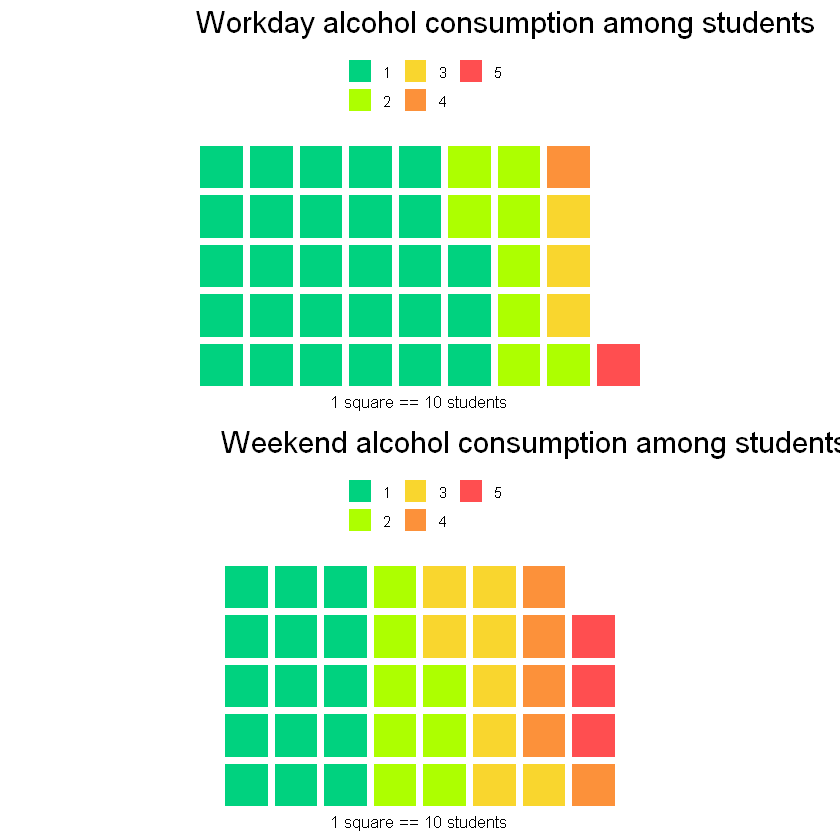

In [27]:

waffle.col <- c("#00d27f","#adff00","#f9d62e","#fc913a","#ff4e50")

alc.d <- waffle(alcohol.d.1,
               rows=5,  
               size=2, 
               title = "Workday alcohol consumption among students",
               glyph_size=8,
               xlab="1 square == 10 students",
               colors=waffle.col,
               legend_pos= "top")


alc.w <- waffle(alcohol.w.1, 
                rows=5, 
                size=2, 
                title = "Weekend alcohol consumption among students",
                glyph_size=8,
                xlab="1 square == 10 students",
                colors=waffle.col,
                legend_pos= "top")




grid.arrange(alc.d,alc.w, nrow=2)


Vrlo je intuitivno i očekivano ono što se pokazalo, a do je da učenici imaju mnogo viši nivo potrošnje alkohol tokom vikenda.
Imam likertovu skalu potrošnje alkohola 1-5.

1-very low

2-low

3-medium

4-High

5-Very high

-  Vidimo da je broj onih učenika koji imaju najvišu potrošnju alkohola(5-Very high) povećan sa 10 na 30( tri puta više)

- Oni koji imaju visoku potrošnju alkohola (4-HIgh) imaju u svojoj grupi umesto kao radnim danima 10 učenika, vikendom 50 učenika(5 puta vise)

- Oni koji su umereni u potrošnji alkohola(3-Medium) takođe imaju značajno uvećanje grupe sa 30 na 80 učenika vikendom

- Oni koji imaju nisku potrošnju alkohola (2-Low) imaju isti broj učenika kao članova grupe i vikendom i tokom radnih dana

- Oni koji imaju veoma nisko frekventnu konzumaciju alkohola (1- Very low) imaju značajno smanjenje grupe sa 280 članova tokom radnih dana na 150 članova tokom vikenda...

Što je očekivano jer očigledno mnogi koji retko piju tokom radnih dana , ustvari su među onima koji više konzumiraju alkohol tokom vikenda

                    **Druga baza podataka- Portugalski jezik** 

In [28]:
sp<-read.csv("C:/Users/Elvira/Desktop/AIV1/student-por.csv",
             header =TRUE,
             sep = ',',
             stringsAsFactors = TRUE)
is.data.frame(sp)
str(sp)
dim(sp)

[1] TRUE

'data.frame':	649 obs. of  33 variables:
 $ school    : Factor w/ 2 levels "GP","MS": 1 1 1 1 1 1 1 1 1 1 ...
 $ sex       : Factor w/ 2 levels "F","M": 1 1 1 1 1 2 2 1 2 2 ...
 $ age       : int  18 17 15 15 16 16 16 17 15 15 ...
 $ address   : Factor w/ 2 levels "R","U": 2 2 2 2 2 2 2 2 2 2 ...
 $ famsize   : Factor w/ 2 levels "GT3","LE3": 1 1 2 1 1 2 2 1 2 1 ...
 $ Pstatus   : Factor w/ 2 levels "A","T": 1 2 2 2 2 2 2 1 1 2 ...
 $ Medu      : int  4 1 1 4 3 4 2 4 3 3 ...
 $ Fedu      : int  4 1 1 2 3 3 2 4 2 4 ...
 $ Mjob      : Factor w/ 5 levels "at_home","health",..: 1 1 1 2 3 4 3 3 4 3 ...
 $ Fjob      : Factor w/ 5 levels "at_home","health",..: 5 3 3 4 3 3 3 5 3 3 ...
 $ reason    : Factor w/ 4 levels "course","home",..: 1 1 3 2 2 4 2 2 2 2 ...
 $ guardian  : Factor w/ 3 levels "father","mother",..: 2 1 2 2 1 2 2 2 2 2 ...
 $ traveltime: int  2 1 1 1 1 1 1 2 1 1 ...
 $ studytime : int  2 2 2 3 2 2 2 2 2 2 ...
 $ failures  : int  0 0 0 0 0 0 0 0 0 0 ...
 $ schoolsup : Factor w/

[1] 649  33

Možemo primetiti da je druga baza takođe u formatu "data frame", 

dimenzija 649(**ispitanika**)x33(**varijable**)

tipa:

- factor ili
- integer

In [29]:
apply(sp, 2, unique)

$school
[1] "GP" "MS"

$sex
[1] "F" "M"

$age
[1] "18" "17" "15" "16" "19" "22" "20" "21"

$address
[1] "U" "R"

$famsize
[1] "GT3" "LE3"

$Pstatus
[1] "A" "T"

$Medu
[1] "4" "1" "3" "2" "0"

$Fedu
[1] "4" "1" "2" "3" "0"

$Mjob
[1] "at_home"  "health"   "other"    "services" "teacher" 

$Fjob
[1] "teacher"  "other"    "services" "health"   "at_home" 

$reason
[1] "course"     "other"      "home"       "reputation"

$guardian
[1] "mother" "father" "other" 

$traveltime
[1] "2" "1" "3" "4"

$studytime
[1] "2" "3" "1" "4"

$failures
[1] "0" "3" "1" "2"

$schoolsup
[1] "yes" "no" 

$famsup
[1] "no"  "yes"

$paid
[1] "no"  "yes"

$activities
[1] "no"  "yes"

$nursery
[1] "yes" "no" 

$higher
[1] "yes" "no" 

$internet
[1] "no"  "yes"

$romantic
[1] "no"  "yes"

$famrel
[1] "4" "5" "3" "1" "2"

$freetime
[1] "3" "2" "4" "1" "5"

$goout
[1] "4" "3" "2" "1" "5"

$Dalc
[1] "1" "2" "5" "3" "4"

$Walc
[1] "1" "3" "2" "4" "5"

$health
[1] "3" "5" "1" "2" "4"

$absences
 [1] " 4" " 2" " 6" " 0" "10" " 8" "16" "14" " 1" "12" "24" "22" "32" "30" "21"
[16] "15" " 9" "18" "26" " 7" "11" " 5" "13" " 3"

$G1
 [1] " 0" " 9" "12" "14" "11" "13" "10" "15" "17" " 8" "16" "18" " 7" " 6" " 5"
[16] " 4" "19"

$G2
 [1] "11" "13" "14" "12" "16" "17" " 8" "10" "15" " 9" " 7" " 6" "18" "19" " 0"
[16] " 5"

$G3
 [1] "11" "12" "14" "13" "17" "15" " 7" "10" "16" " 9" " 8" "18" " 6" " 0" " 1"
[16] " 5" "19"

- Ovu funkciju sam ponovo upotrebila jer je kao što rekoh vrlo korisna (kako bi stekli uvid u **sve varjable** i koje su njihove **jedinstvene vrednosti** na nivou celog dataseta).

In [30]:

sum(apply(sp, 2, is.na))


[1] 0

Nema nedostajućih vrednosti

Odnos dečaka i devojčica u datasetu student-por.csv(sp) koji se odnosi na one koji su pohađali Portugalski jezik.

In [31]:
df1 <- data.frame(gender_group = c("Male", "Female"),
count =c(266,383))
df1

gender_group,count
Male,266
Female,383



  F   M 
383 266 

HTML widgets cannot be represented in plain text (need html)

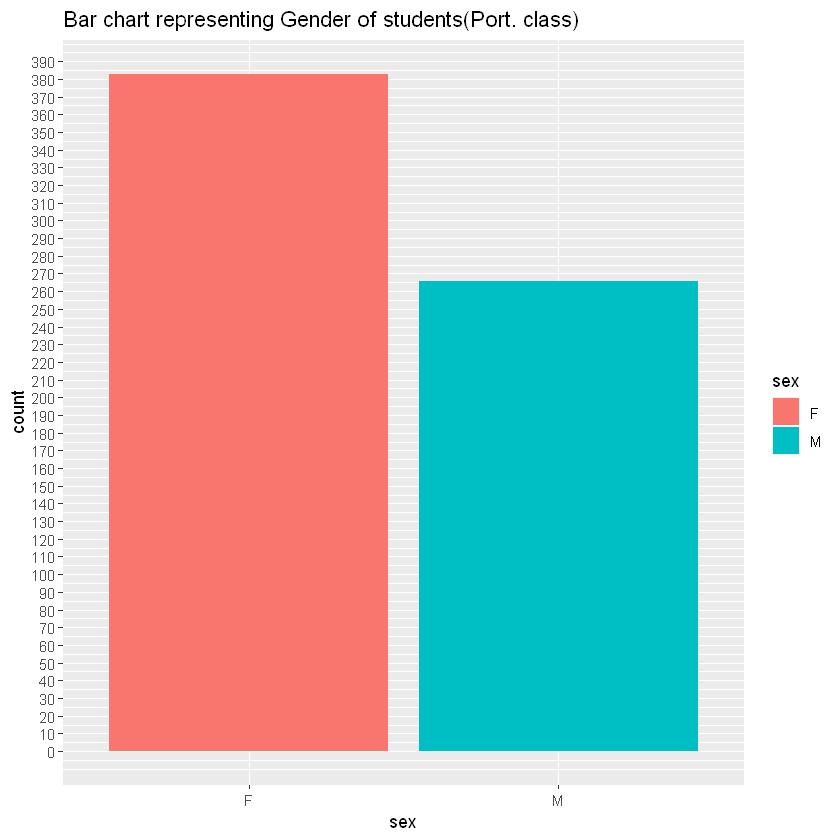

In [32]:
table(sp$sex)

#Primer kako se može korisitit i druga funkcija koja daje pie chart ali pie chart neće biti 
#prikazan jer funkcija plot_ly ne daje tu mogućnost u pdf formatu

hjk＜- plot_ly(data = df1,
              labels = ~df$gender_group,
              values = ~count,
              type = 'pie',
              sort= FALSE,
              marker= list(colors=colors, line = list(color="black", width=1))) %＞%
     layout(title="Pie chart representing Gender of students(Port. class)\
                         (with Plotly)")
hjk
sas<-ggplot(sp, aes(x=sex)) + 
  geom_bar(stat = "count",
                 aes(fill = sex))+
  scale_y_continuous(breaks = seq(0,390,10))+
  ggtitle("Bar chart representing Gender of students(Port. class)")

sas

          **Istraživačka pitanja, analiza, tumačenje i odgovori na postavljena pitanja**

**Kako izabrati koji test upotrebiti pri analizi i davanju odgovora na željeno pitanje?**

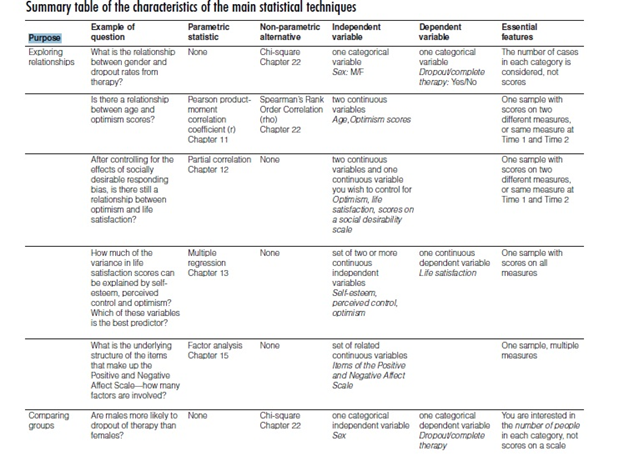
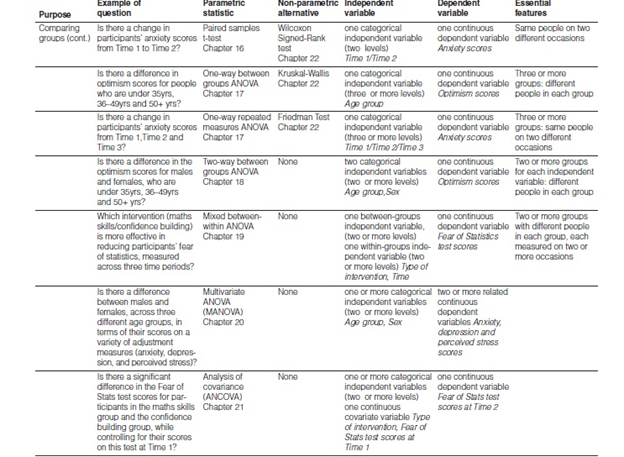
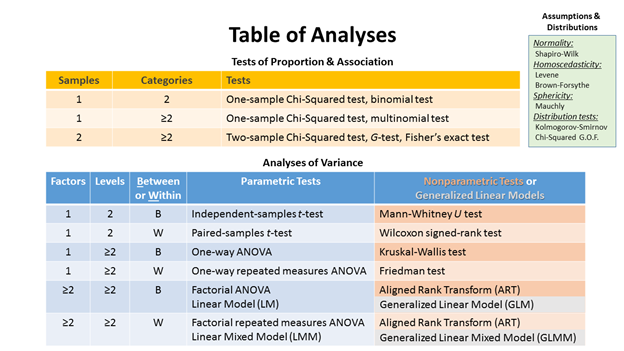

- Parametric and Non-parametric tests for comparing two or more groups
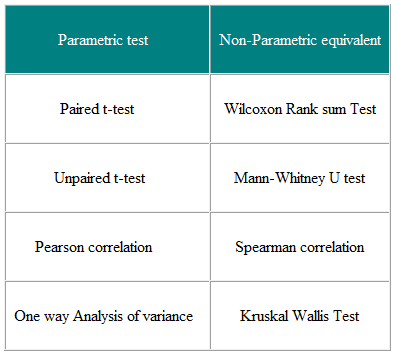


Istraživačko pitanje:

- Da li postoji statistički značajna razlika u **konačnoj oceni** iz matematike/portugalskog izmedju **dečaka i devojčica**?

1. **Zavisnu varijablu** u mom slučaju predstavljaju **konačne ocene** učenika iz obe škole iz matematike/portugalskog merene u rasponu od 0-20 (U obrazovnom sistemu Portugala se kreću u tom rasponu od 0-20, pri čemu su vrednosti od 16-20 ekvivalentne oceni 5 kod nas u Srbiji ili oceni A,od 14-15 oceni 4 ili B, 12-13 oceni 3 ili C, od 10-11 oceni 2 ili D, 0-9 oceni 1 ili F)

2. **Nezavisna varijabla** je **pol** učenika, u ovom slučaju muški i ženski pol.

Ho: **Ne postoji** statistički značajna razlika u konačnoj oceni iz matematike/portugalskog između ove dve grupe (dečaka i devojčica)

H1: **Postoji** statistički značajna razlika u konačnoj oceni iz matematike/portugalskog između ove dve grupe (dečaka i devojčica)

- Prethodno sam proverila, broj muškaraca i žena u uzorku je približno jednak (F=208, M=187)

- Takođe prethodno je uočeno i za drugi dataset koji se odnosi na portugalski da je broj muškaraca i žena u uzorku dovoljno usklađen(F=383,M=266)

Sada ću da proverim da li postoje značajna odstupanja kod **kontinualne varijable - G3** ili konačna ocena

Prvo ću koristiti **jednostavnu vizuelizaciju gustine**, a zatim pomoću ggplot funkcije prikazaću **raspodelu ocena iz matematike/portugalskog** medju svim studentima.


Call:
	density.default(x = sm$G3)

Data: sm$G3 (395 obs.);	Bandwidth 'bw' = 1.219

       x                y            
 Min.   :-3.657   Min.   :1.243e-05  
 1st Qu.: 3.172   1st Qu.:7.050e-03  
 Median :10.000   Median :2.502e-02  
 Mean   :10.000   Mean   :3.657e-02  
 3rd Qu.:16.828   3rd Qu.:6.502e-02  
 Max.   :23.657   Max.   :1.083e-01  

Warning message:
"geom_vline(): Ignoring `mapping` because `xintercept` was provided."Warning message:
"geom_vline(): Ignoring `data` because `xintercept` was provided."

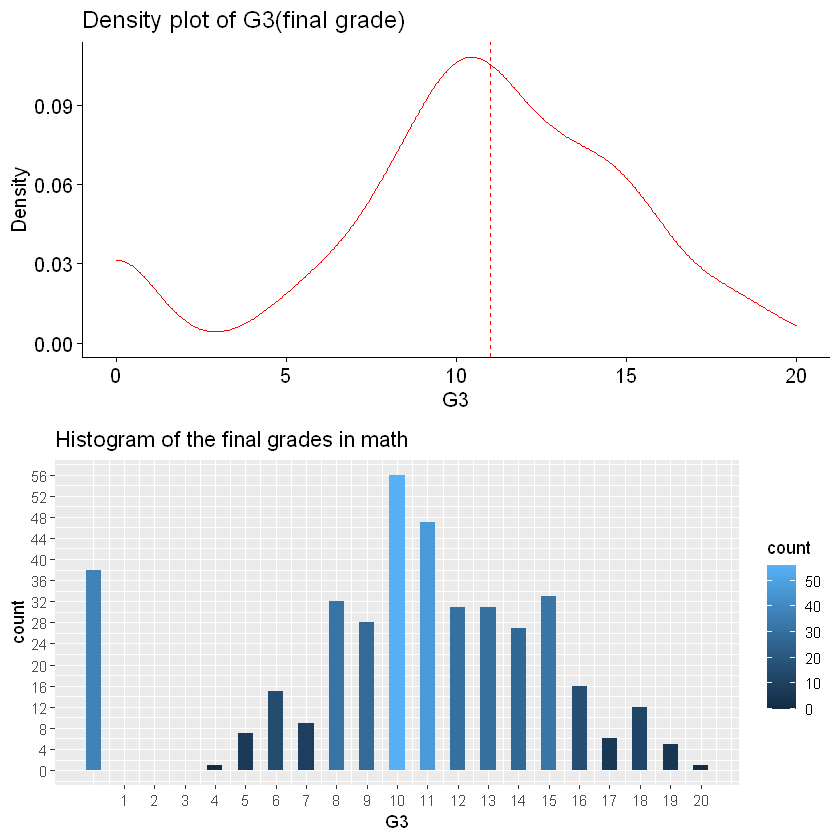

In [33]:
#?density
density(sm$G3)
#?ggdensity
deg3<-ggdensity(sm$G3, 
          main="Density plot of G3(final grade)",
          xlab="G3",
          ylab="Density",
          col = "red",
          add = c("median"))   


hisg3<-ggplot(sm, aes(x=G3)) + 
  geom_histogram(binwidth = 0.5, aes(fill = ..count..))+
  scale_x_continuous(breaks = seq(1,20,1))+
  scale_y_continuous(breaks = seq(0,80,4))+
  ggtitle("Histogram of the final grades in math")

grid.arrange(deg3,hisg3,nrow=2)



Call:
	density.default(x = sp$G3)

Data: sp$G3 (649 obs.);	Bandwidth 'bw' = 0.7358

       x                y            
 Min.   :-2.207   Min.   :1.987e-05  
 1st Qu.: 3.646   1st Qu.:2.108e-03  
 Median : 9.500   Median :1.568e-02  
 Mean   : 9.500   Mean   :4.267e-02  
 3rd Qu.:15.354   3rd Qu.:7.786e-02  
 Max.   :21.207   Max.   :1.469e-01  

Warning message:
"geom_vline(): Ignoring `mapping` because `xintercept` was provided."Warning message:
"geom_vline(): Ignoring `data` because `xintercept` was provided."

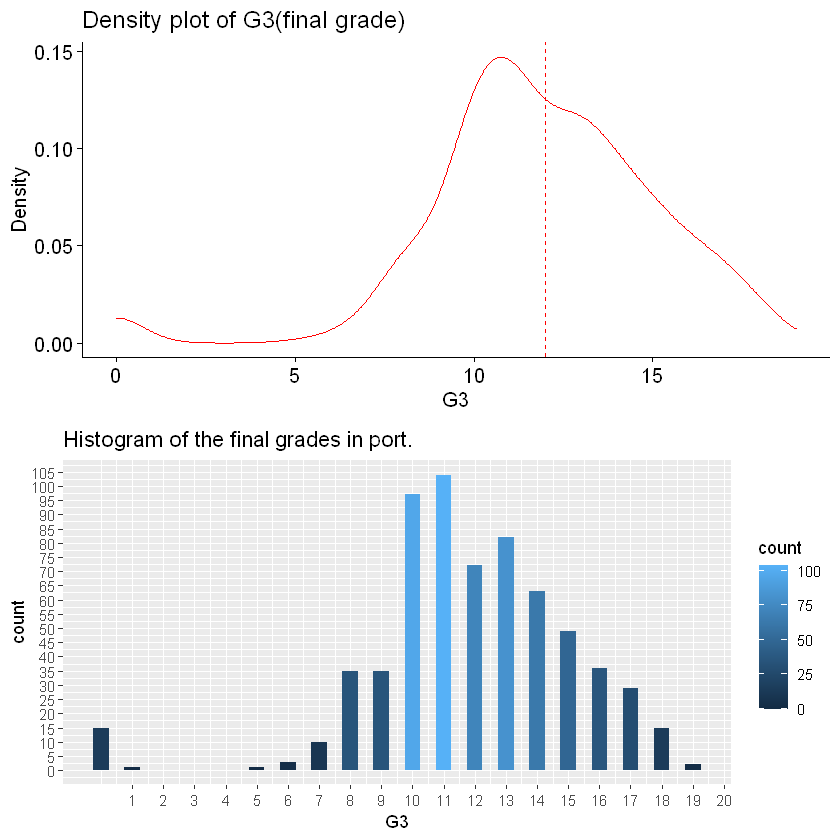

In [34]:
#?density
density(sp$G3)
#?ggdensity
deg31<-ggdensity(sp$G3, 
          main="Density plot of G3(final grade)",
          xlab="G3",
          ylab="Density",
          col = "red",
          add = c("median"))   


hisg31<-ggplot(sp, aes(x=G3)) + 
  geom_histogram(binwidth = 0.5, aes(fill = ..count..))+
  scale_x_continuous(breaks = seq(1,20,1))+
  scale_y_continuous(breaks = seq(0,120,5))+
  ggtitle("Histogram of the final grades in port.")

grid.arrange(deg31,hisg31,nrow=2)


Posmatrajući ove vizuelizacije mogu da uočim da je **gustina raspodele** kontinualne promenjive G3- **finalna ocena** samo delimično sličan normalnoj raspodeli,

međutim posebno **problematično** se čini što postoji veći broj studenata koji je ostvario ocenu **nula**, što značajno **remeti raspodelu**. I sigurno utiče na prosečnu ocenu tako što je snižava. 

Bilo bi dobro da studente koji pripadaju ovoj grupi izbacim iz posmatranja jer oni čine neku vrstu **"outliers-a"-ekstremnih vrednosti** koje remete distribuciju i rezultate testova.

**Međutim u slučaju drugog dataseta treba istaći da je značajno manji broj studenata koji je ostvario ocenu nula u portugalskom jeziku nego što je to broj studenata sa istom ocenom iz matematike okvirno 15:38.

Sada želim vizuelno da predstavim **razliku u konačnoj oceni** iz matemtike/portugalskog izmedju **dečaka i devojčica**.

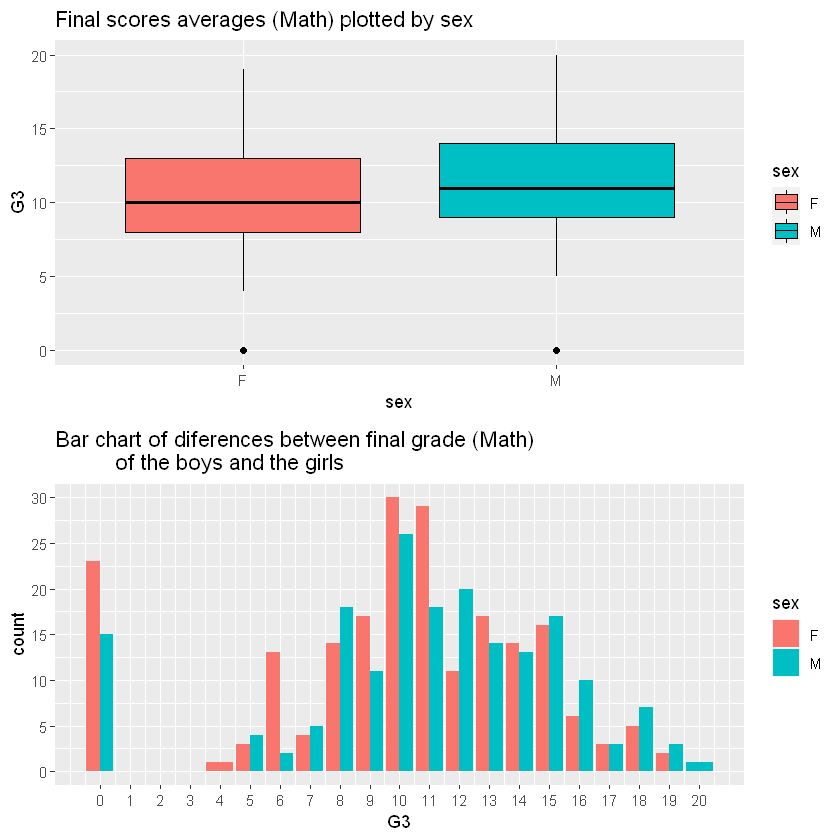

In [35]:
#?geom_bar
fin<-ggplot(data=sm, aes(x=G3, fill=sex))+
  geom_bar(stat="count",
           position="dodge",
           color="NA")+
  scale_x_continuous(breaks = seq(0,20,1))+
  scale_y_continuous(breaks = seq(0,30,5))+
  ggtitle("Bar chart of diferences between final grade (Math)\
          of the boys and the girls ")
#?geom_boxplot
avsf<-ggplot(sm, aes(x = sex, y = G3, fill=sex)) +
  geom_boxplot(col = "black") +
  ggtitle("Final scores averages (Math) plotted by sex")

grid.arrange(avsf,fin,nrow=2)

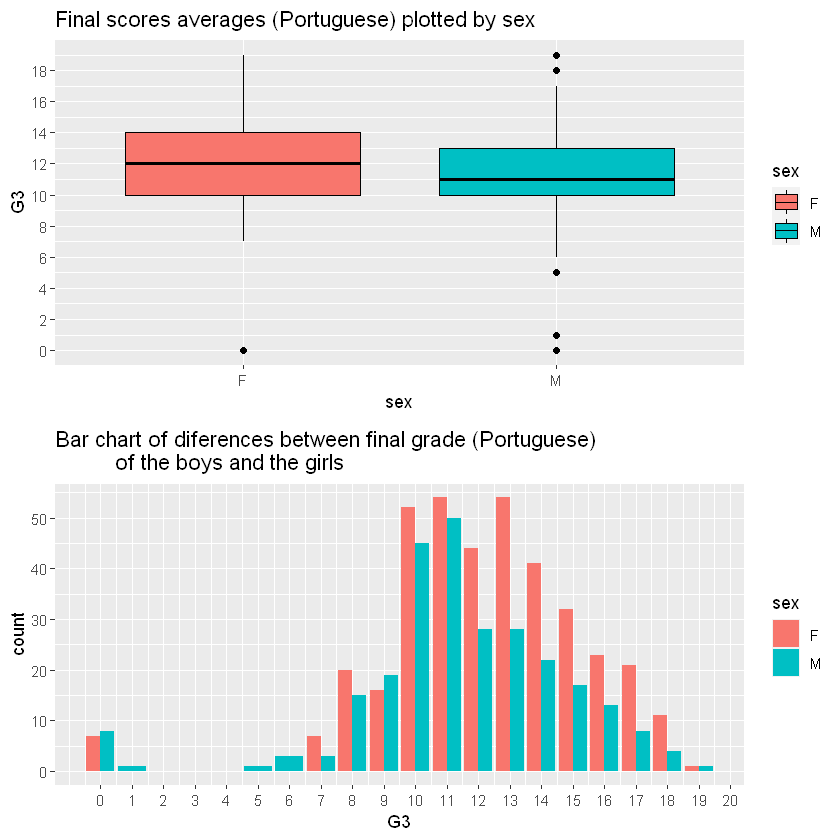

In [36]:
#?geom_bar
fin1<-ggplot(data=sp, aes(x=G3, fill=sex))+
  geom_bar(stat="count",
           position="dodge",
           color="NA")+
  scale_x_continuous(breaks = seq(0,20,1))+
  scale_y_continuous(breaks = seq(0,60,10))+
  ggtitle("Bar chart of diferences between final grade (Portuguese)\
          of the boys and the girls ")
#?geom_boxplot
avsf1<-ggplot(sp, aes(x = sex, y = G3, fill=sex)) +
  geom_boxplot(col = "black") +
  scale_y_continuous(breaks = seq(0,20,2))+
  ggtitle("Final scores averages (Portuguese) plotted by sex")

grid.arrange(avsf1,fin1,nrow=2)

- Poprilično je teško dobiti ideju o razlici u konačnoj oceni izmedju polova na osnovu vizuelnog prikaza.

- Čini se da je raspodela vrlo slična, sa blagim odstupanjem u korist dečaka u prvom datasetu.

- S druge strane postoji vidljivo odstupanje u korist devojčica u drugom datasetu koji se odnosi na portugalski jezik.

Dečacima idu "brojevi", a devojčice dobre u "(materenjem) jeziku", poznat nam stereotip?



Sada proveravam razliku **prosečne krajnje ocene** izmedju dečaka i devojčica.

- Prvo za dataset vezan za matematiku
- Zatim dataset koji se odnosi na portugalski


In [37]:

mean(sm$G3[sm$sex=="F"])
#9.966346
mean(sm$G3[sm$sex=="M"])
#10.91444

9.966346-10.91444
#-0.94

#Diferent method
aggregate(sm$G3,
          by=list(sm$sex),
          FUN="mean",
          na.rm=TRUE)



[1] 9.966346

[1] 10.91444

[1] -0.948094

Group.1,x
F,9.966346
M,10.914439


In [38]:
mean(sp$G3[sp$sex=="F"])
#12.25326
mean(sp$G3[sp$sex=="M"])
#11.406015

12.25326-11.406015
#0.847244

#Diferent method
aggregate(sp$G3,
          by=list(sp$sex),
          FUN="mean",
          na.rm=TRUE)


[1] 12.25326

[1] 11.40602

[1] 0.847245

Group.1,x
F,12.25326
M,11.40602


- Sada ću **neuključujući učenike koji su pali predmet matematka/portugalski** , da proveravim razliku prosečne krajnje ocene izmedju dečaka i devojčica.


In [39]:
mean(sp$G3[sp$sex=="F" & sp$G3>0])
#12.48138
mean(sp$G3[sp$sex=="M" & sp$G3>0])
#11.75969

12.48138-11.75969
#0.721689

aggregate(sp$G3[sp$G3>0],
          by=list(sp$sex[sp$G3>0]),
          FUN="mean",
          na.rm=TRUE)
aggregate(sp$G3[sp$G3>0],
          by=list(sp$sex[sp$G3>0]),
          FUN="median",
          na.rm=TRUE)

[1] 12.48138

[1] 11.75969

[1] 0.72169

Group.1,x
F,12.48138
M,11.75969


Group.1,x
F,12
M,11


In [40]:

mean(sm$G3[sm$sex=="F" & sm$G3>0])
#11.20541
mean(sm$G3[sm$sex=="M" & sm$G3>0])
#11.86628

11.20541-11.86628
#-0.66

aggregate(sm$G3[sm$G3>0],
          by=list(sm$sex[sm$G3>0]),
          FUN="mean",
          na.rm=TRUE)
aggregate(sm$G3[sm$G3>0],
          by=list(sm$sex[sm$G3>0]),
          FUN="median",
          na.rm=TRUE)


[1] 11.20541

[1] 11.86628

[1] -0.66087

Group.1,x
F,11.20541
M,11.86628


Group.1,x
F,11
M,12


- U oba slučaja i sa uljučenim studentima koji su pali matematiku i bez njih vidimo da postoji pozitivna razlika **u korist dečaka** naspram devojčica kada je u pitanju mediana krajnje ocene( dataset koji se odnosi na matematiku) -> 11 devojčice naspram 12 dečaci; mediana

- U drugom datasetu koji se odnosi na portugalski vidimo da **devojčice** ostvarauju višu prosečnu ocenu nego dečaci.(12 devojčice naspram 11 dečaci; mediana)

- Sada ću obaviti Šapirov test da vidim da li konačna ocena (G3) ima normalnu raspodelu, ali rešila sam da izuzmem učenike koji nisu položili  matematiku, jer povlače prosečnu ocenu niže te remete ravnomernu distribuciju ocene.

In [41]:

shapiro.test(sm$G3[sm$G3>0])
shapiro.test(sm$G3[sm$sex=="F" & sm$G3>0])
shapiro.test(sm$G3[sm$sex=="M" & sm$G3>0])




	Shapiro-Wilk normality test

data:  sm$G3[sm$G3 > 0]
W = 0.98082, p-value = 0.000109



	Shapiro-Wilk normality test

data:  sm$G3[sm$sex == "F" & sm$G3 > 0]
W = 0.97856, p-value = 0.006042



	Shapiro-Wilk normality test

data:  sm$G3[sm$sex == "M" & sm$G3 > 0]
W = 0.97881, p-value = 0.009934


Normalna raspodela odredjene varijable postoji ako je vrednost p>0,05.

         U mom slučaju konačna ocena nema normalnu raspodelu jer p vrednost iznosi:

- generalno kod svih onih koji su imali pozitivnu ocenu p-value = **0.000109**

- kod ocena dečaka p= **0.009934**

- kod ocena devojčica p= **0.006042**.

Uvek je **ispod 0,05** kao što vidimo. 

- Što znači da **ne važi Ho koja predpostavlja normalnu raspodelu**, već alternativna hipoteza H1 koja predpostavlja da normalna raspodela NE POSTOJI.


In [42]:
shapiro.test(sp$G3[sp$G3>0])
shapiro.test(sp$G3[sp$sex=="F" & sp$G3>0])
shapiro.test(sp$G3[sp$sex=="M" & sp$G3>0])




	Shapiro-Wilk normality test

data:  sp$G3[sp$G3 > 0]
W = 0.97662, p-value = 1.591e-08



	Shapiro-Wilk normality test

data:  sp$G3[sp$sex == "F" & sp$G3 > 0]
W = 0.97472, p-value = 3.884e-06



	Shapiro-Wilk normality test

data:  sp$G3[sp$sex == "M" & sp$G3 > 0]
W = 0.97132, p-value = 4.667e-05


Uvek je **ispod 0,05** kao što vidimo. 

- Što znači da **ne važi Ho koja predpostavlja normalnu raspodelu**, već alternativna hipoteza H1 koja predpostavlja da normalna raspodela NE POSTOJI.

                   *Takođe ću uraditi Bartletov test homogenosti varijanse.*

*Postoji nekoliko načina da se proveri da li su vraijnse za dve grupe homogene.
Za ovo je dostupno nekoliko različitih testova - koristiću

- Bartlettov test

- i takođe Levenov test,

ali mnogi drugi testovi bi bili jednako primenljivi.

Oba se testa u R-u lako implementiraju.

* Budite pažljivi u tumačenju rezultata ovog testa: nadate se da ćete utvrditi da test nije značajan (tj. Nivo značajnosti veći od .05). Ako dobijete vrednost značajnosti manju od 0,05, to sugeriše da varijanse za dve grupe nisu jednake, pa ste stoga prekršili pretpostavku o homogenosti varijanse.

Ne paničite ako utvrdite da je to slučaj. Analiza varijanse je prilično robusna u odnosu na kršenje ove pretpostavke, pod uslovom da je veličina vaših grupa približno slična

(npr. najveći / najmanji = 1.5 , Stevens, 1996, str. 249).*

In [43]:
#bartlett.test
bartlett.test(sm$G3[sm$G3 > 0] ~ sm$sex[sm$G3 > 0])
#leven
leveneTest(y = sm$G3, group = sm$sex)


	Bartlett test of homogeneity of variances

data:  sm$G3[sm$G3 > 0] by sm$sex[sm$G3 > 0]
Bartlett's K-squared = 0.12148, df = 1, p-value = 0.7274


,Df,F value,Pr(>F)
group,1,0.06847572,0.7937063
,393,NA,NA


- Možemo primetiti da su oba testa pokazala homogenost varijanse za ove dve grupe(G3 -> M/F)

Identičan test homogenosti varijnse samo za učenike koji su okviru data seta koji se odnosi na Portugalski.

In [44]:
#bartlett.test
bartlett.test(sp$G3[sp$G3 > 0] ~ sp$sex[sp$G3 > 0])
#leven
leveneTest(y = sp$G3, group = sp$sex)


	Bartlett test of homogeneity of variances

data:  sp$G3[sp$G3 > 0] by sp$sex[sp$G3 > 0]
Bartlett's K-squared = 0.017199, df = 1, p-value = 0.8957


,Df,F value,Pr(>F)
group,1,0.007145147,0.932662
,647,NA,NA


- Možemo primetiti da su oba testa pokazala homogenost varijanse za ove dve grupe(G3 -> M/F), međutim u ovom drugom datasetu vrednosti su vrlo visoke, što je odlično. 


Da bih konačno odgovorila na pitanje da li postoji razlika u konačnoj oceni izmedju dečaka i devojčica odlučil sam se da uradim sledeći test:
- independent 2-group Mann-Whitney U Test

wilcox.test(y~A)

where y is numeric and A is A binary factor



                       
                         #Independent 2-group Mann-Whitney U Test

In [45]:
wilcox.test(sm$G3[sm$G3 > 0] ~ sm$sex[sm$G3 > 0])


	Wilcoxon rank sum test with continuity correction

data:  sm$G3[sm$G3 > 0] by sm$sex[sm$G3 > 0]
W = 14190, p-value = 0.07618
alternative hypothesis: true location shift is not equal to 0


 Ho:**Ne postoji statistički značajna razlika**  u konačnoj oceni iz matematike između ove dve grupe (dečaka i devojčica)

H1: Postoji statistički značajna razlika u konačnoj oceni iz matematike između ove dve grupe (dečaka i devojčica)


**CONCLUSION: Ne odbacujem Ho(nultu hipotezu)**

što ne znači da definitivno ne postoji razlika u konačnoj oceni izmedju ove dve grupe, nego da u mom slučaju primenom neparematarskog :Independent 2-group Mann-Whitney U Test-a na ovom uzorku nije pronađena statistički značajna razlika, potrebna su dalja istraživanja. Međutim mora se istaći da p vrednost nije bila daleko od potencijalne značajnosti i da je ovo sociološko istraživanje u kojima generalno većinom ne primenjuju taj stepen strogosti kao u prirodnim naukama gde se često traže vrednosti niže i od 0,01.


                                        Isti test
- samo na drugoj bazi gde tražimo odgovor na identično pitanje samo za učenike koji su u okviru dataseta koji se odnosi na Portugalski.

In [46]:
#kruskal.test (sm$G3[sm$G3 > 0] ~ sm$sex[sm$G3 > 0],
            #  data=sm)


wilcox.test(sp$G3[sp$G3 > 0] ~ sp$sex[sp$G3 > 0])


	Wilcoxon rank sum test with continuity correction

data:  sp$G3[sp$G3 > 0] by sp$sex[sp$G3 > 0]
W = 55881, p-value = 0.001045
alternative hypothesis: true location shift is not equal to 0


Ho:Ne postoji statistički značajna razlika u konačnoj oceni iz portugalskog između ove dve grupe (dečaka i devojčica)

H1: Postoji statistički značajna razlika u konačnoj oceni iz portugalskog između ove dve grupe (dečaka i devojčica)

CONCLUSION: Odbacujem Ho(nultu hipotezu), u korist alternativne hipoteze H1.
Postoji statistički značajna razlika u oceni iz portugalskog jezika između dečaka i devojčica(u korist devojčica).

                      Kako obrazovanje roditelja utiče na krajnju ocenu?
        Postoji li statistički značajna razlika u konačnoj oceni učenika u zavisnosti od 
                                   nivoa obrazovanja oca/majke ?


Ho:**Ne postoji** statistički značajna razlika u konačnoj oceni učenika iz portugalskog u zavisnosti od nivoa obrazovanja oca/majke.

H1: **Postoji** statistički značajna razlika u konačnoj oceni učenika iz portugalskog  u zavisnosti od nivoa obrazovanja oca/majke.

- Zavisna varijabla krajnje ocene iz portugalskog (G3)(0-20) 

- Nezavisna varijabla :

1. Medu -> nivo obrazovanja majke(0-4)

2. Fedu-> nivo obrazovanja oca (0-4)

In [47]:
str(sp$Medu)

 int [1:649] 4 1 1 4 3 4 2 4 3 3 ...


HTML widgets cannot be represented in plain text (need html)

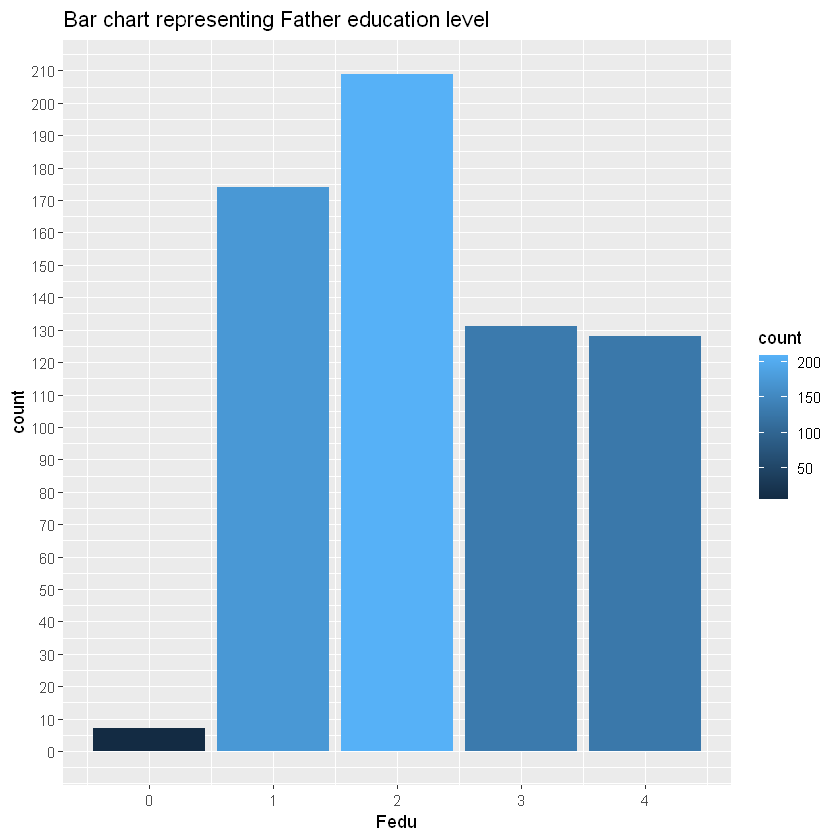

In [48]:
ch ＜- plot_ly(data = sp, labels = ~sp$Fedu, values = ~sum, 
             type = 'pie', sort= FALSE,
            marker= list(colors=colors, line = list(color="black", width=1))) %＞%
            layout(title="Pie chart for Father education level\
                                    (with Plotly)")
ch

ggplot(sp, aes(x=Fedu)) + 
  geom_bar(stat = "count",
                 aes(fill =..count..))+
  scale_y_continuous(breaks = seq(0,210,10))+
  ggtitle("Bar chart representing Father education level")

HTML widgets cannot be represented in plain text (need html)

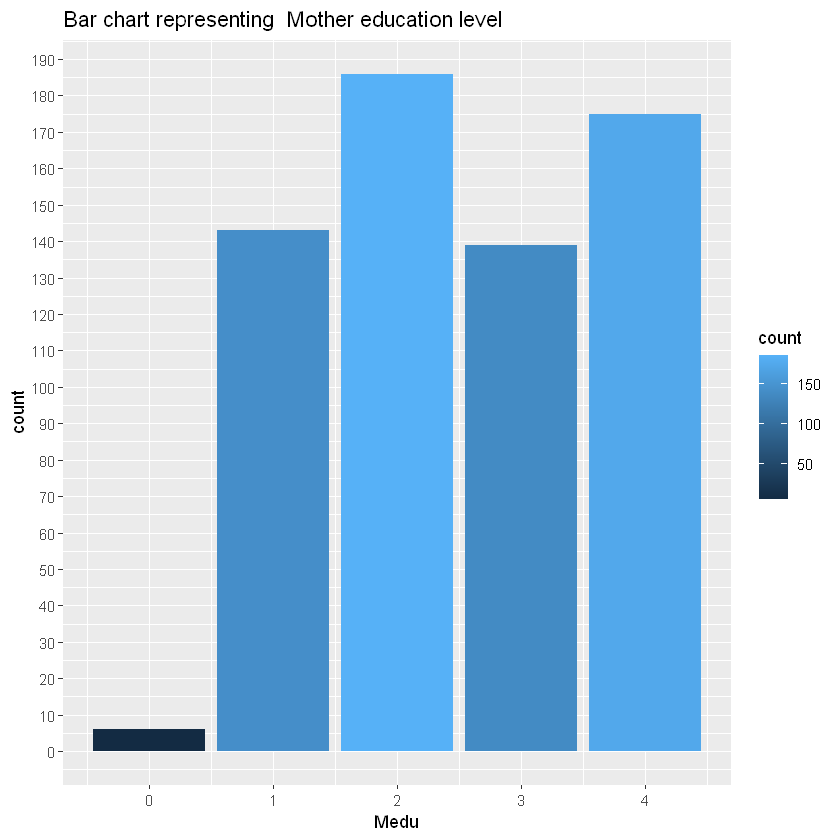

In [49]:
gh ＜- plot_ly(data = sp, labels = ~sp$Medu, values = ~sum, 
             type = 'pie', sort= FALSE,
            marker= list(colors=colors, line = list(color="black", width=1))) %＞%
            layout(title="Pie chart for Mother education level\
                                    (with Plotly)")
gh
ggplot(sp, aes(x=Medu)) + 
  geom_bar(stat = "count",
                 aes(fill =..count..))+
  scale_y_continuous(breaks = seq(0,190,10))+
  ggtitle("Bar chart representing  Mother education level")

Videli smo kroz prethodno istraživačko pitanje da krajnja ocena- G3 nema normalnu raspodelu (koristila sam Šapirov test)‚ ali hajde da proverimo za ovo istraživačko pitanje.

In [50]:
shapiro.test(sp$G3)
shapiro.test(sp$G3[sp$Medu])
shapiro.test(sp$G3[sp$Fedu])




	Shapiro-Wilk normality test

data:  sp$G3
W = 0.92598, p-value < 2.2e-16



	Shapiro-Wilk normality test

data:  sp$G3[sp$Medu]
W = 0.70606, p-value < 2.2e-16



	Shapiro-Wilk normality test

data:  sp$G3[sp$Fedu]
W = 0.66044, p-value < 2.2e-16


Normalnu raspodelu nemamo ni približno to možemo da vidimo već u sledećem koraku i po vizuelizaciji, 
gde vidimo izraženu zaravnjenost krive.

Normalna raspodela odredjene varijable postoji ako je vrednost p>0,05.
Uvek je značajno **ispod 0,05** kao što vidimo. 

- Što znači da **ne važi Ho koja predpostavlja normalnu raspodelu**, već alternativna hipoteza H1 koja predpostavlja da normalna raspodela NE POSTOJI.

Posmatraću medianu završnih ocena uzimajući u obzir nivoe obrazovanja prvo kod majke, a zatim ko oca.


Medu,G3
0,11
1,11
2,12
3,12
4,13


Fedu,G3
0,11
1,11
2,12
3,12
4,13


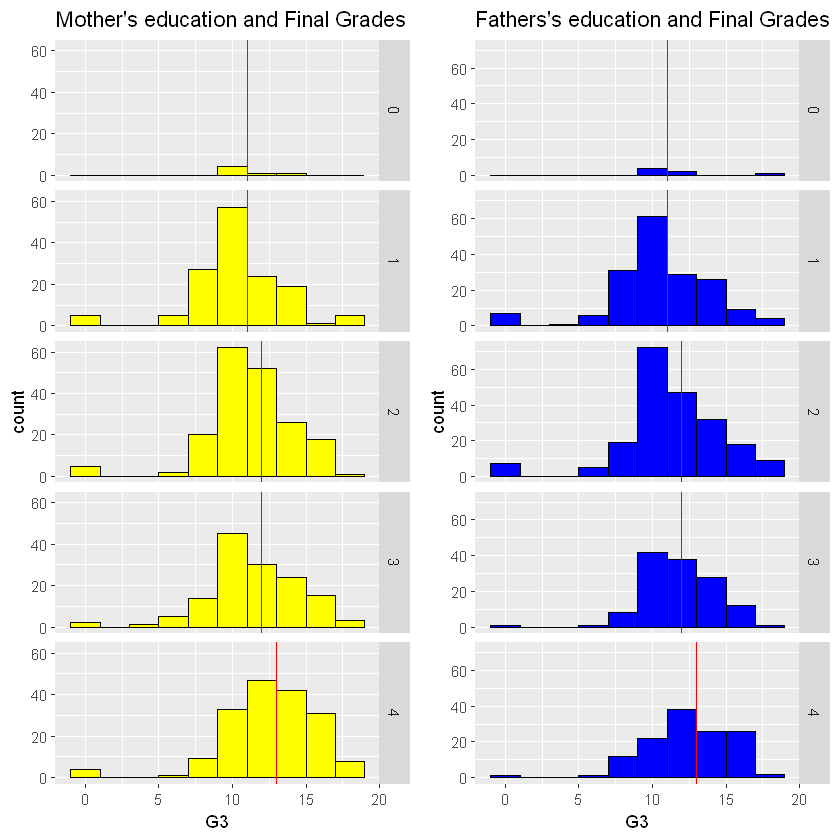

In [51]:
aggregate(sp[33],
          sp[7],
          median)

mg3<-ggplot(sp, aes(x=G3)) +
        geom_histogram(fill="yellow", colour="black", binwidth = 2) +
        facet_grid(Medu ~ .)+
        ggtitle("Mother's education and Final Grades")+
        geom_vline(data=aggregate(sp[33],
                                  sp[7],
                                  median),
                   mapping=aes(xintercept=G3),
                   color="red")


aggregate(sp[33],
          sp[8],
          median)


fg3<-ggplot(sp, aes(x=G3)) +
      geom_histogram(fill="blue", colour="black", binwidth = 2) +
      facet_grid(Fedu ~ .)+
      ggtitle("Fathers's education and Final Grades")+
      geom_vline(data=aggregate(sp[33],
                                 sp[8],
                                median),
           mapping=aes(xintercept=G3),
           color="red")

grid.arrange(mg3,fg3,ncol=2)

Vidimo da kako se nivo obrazovanja majke povećava, tako se povećavaju i mediane za G3(konačnu ocenu iz Portugalskog jezika).

- Kroz ovaj prikaz možemo videti da je nivo obrazovanja majke važan faktor za postizanje dobrih ocena. 

Da li nivo obrazovanja oca ima isti nivo važnosti?

- Kada je u pitanju očev nivo obrazovanja primećujemo isti trend rasta mediane G3 - konačne ocene učenika iz Portugalskog jezika.

Sada da bi smo videli da li postoji stvarno razlika izmedju ovih grupa, primeniću 	
- Kruskal-Wallis Test Oneway ANOVA by ranks

kruskal.test(y~a)
- gde je y numerička vrednsot
- i a je faktor



In [52]:
sp$Medu<-factor(sp$Medu,
                     levels=c(0,1,2,3,4),
                     labels=c("none",
                              "primary education ",
                              "5th to 9th grade",
                              "secondary education",
                              "higher education"))
sp$Fedu<-factor(sp$Fedu,
                     levels=c(0,1,2,3,4),
                     labels=c("none",
                              "primary education ",
                              "5th to 9th grade",
                              "secondary education",
                              "higher education"))

In [53]:
table(sp$G3,sp$Medu)
table(sp$G3,sp$Fedu)
kruskal.test(sp$G3~sp$Medu)
kruskal.test(sp$G3~sp$Fedu)

kruskal.test(sp$G3~sp$Medu)
kruskal.test(sp$G3~sp$Fedu)

    
     none primary education  5th to 9th grade secondary education
  0     0                  5                5                   1
  1     0                  0                0                   1
  5     0                  0                0                   1
  6     0                  0                2                   0
  7     0                  5                0                   5
  8     0                 10               10                   9
  9     0                 17               10                   5
  10    1                 31               32                  23
  11    3                 26               30                  22
  12    1                 11               25                  14
  13    0                 13               27                  16
  14    0                 12               15                  12
  15    1                  7               11                  12
  16    0                  1               13                   7
  17 

    
     none primary education  5th to 9th grade secondary education
  0     0                  7                7                   0
  1     0                  0                0                   1
  5     0                  1                0                   0
  6     0                  2                0                   0
  7     0                  4                5                   1
  8     0                 11               11                   3
  9     0                 20                8                   5
  10    2                 34               36                  18
  11    2                 27               36                  24
  12    1                 16               21                  15
  13    1                 13               26                  23
  14    0                 16               17                  15
  15    0                 10               15                  13
  16    0                  8                9                   5
  17 


	Kruskal-Wallis rank sum test

data:  sp$G3 by sp$Medu
Kruskal-Wallis chi-squared = 57.215, df = 4, p-value = 1.115e-11



	Kruskal-Wallis rank sum test

data:  sp$G3 by sp$Fedu
Kruskal-Wallis chi-squared = 36.785, df = 4, p-value = 1.994e-07



	Kruskal-Wallis rank sum test

data:  sp$G3 by sp$Medu
Kruskal-Wallis chi-squared = 57.215, df = 4, p-value = 1.115e-11



	Kruskal-Wallis rank sum test

data:  sp$G3 by sp$Fedu
Kruskal-Wallis chi-squared = 36.785, df = 4, p-value = 1.994e-07


Ho:Ne postoji statistički značajna razlika u konačnoj oceni učenika u zavisnosti od nivoa obrazovanja oca/majke.

H1:Postoji statistički značajna razlika u konačnoj oceni učenika u zavisnosti od nivoa obrazovanja oca/majke.

Potvrđuje se Ho ako je p>0,05

Kako p ima veoma niske vrednosti:
-  p-value = 1.115e-11
-  p-value = 1.994e-07
Ho se odbacuje te -> Postoji statistički značajna razlika u konačnoj oceni učenika u zavisnosti iz portugalskog od nivoa obrazovanja oca/majke.

                             Veza između ocena iz različitih perioda? 
                               - Između prvog(G1) i drugog(G2), 
                               - Prvog(G1) i trećeg(G3), 
                               - Drugog(G2) i trećeg perioda(G3).

In [54]:
shapiro.test(sm$G3)
shapiro.test(sm$G1)
shapiro.test(sm$G2)



	Shapiro-Wilk normality test

data:  sm$G3
W = 0.92873, p-value = 8.836e-13



	Shapiro-Wilk normality test

data:  sm$G1
W = 0.97491, p-value = 2.454e-06



	Shapiro-Wilk normality test

data:  sm$G2
W = 0.96914, p-value = 2.084e-07


- ako je p>0,05 opstaje Ho koja predpostavlja normalnu raspdelu, međutim ocena NEMA normalnu raspodelu u ni jednom periodu od 3 moguća

In [55]:
shapiro.test(sp$G3)
shapiro.test(sp$G1)
shapiro.test(sp$G2)



	Shapiro-Wilk normality test

data:  sp$G3
W = 0.92598, p-value < 2.2e-16



	Shapiro-Wilk normality test

data:  sp$G1
W = 0.98554, p-value = 4.934e-06



	Shapiro-Wilk normality test

data:  sp$G2
W = 0.96167, p-value = 5.583e-12


- ako je p>0,05 opstaje Ho koja predpostavlja normalnu raspdelu, međutim ocena NEMA normalnu raspodelu u ni jednom periodu od 3 moguća

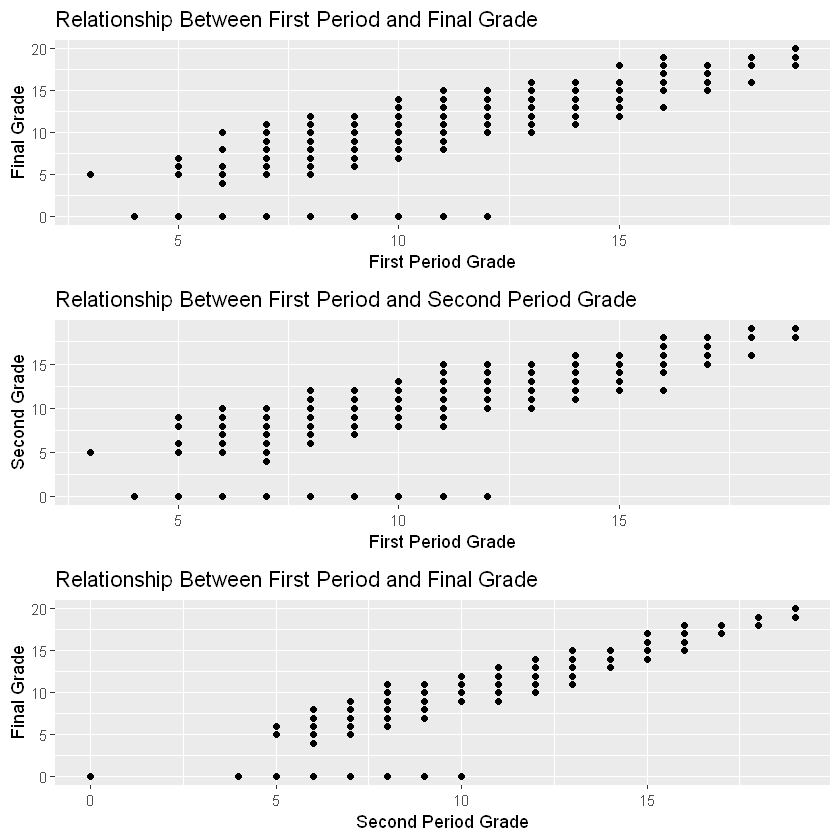

In [56]:
g1g3<-ggplot(sm, aes(x=G1, y=G3))+
        geom_point()+
        ggtitle("Relationship Between First Period and Final Grade")+
        xlab("First Period Grade")+
        ylab("Final Grade")
g1g2<-ggplot(sm, aes(x=G1, y=G2))+
        geom_point()+
        ggtitle("Relationship Between First Period and Second Period Grade")+
        xlab("First Period Grade")+
        ylab("Second Grade")

g2g3<-ggplot(sm, aes(x=G2, y=G3))+
        geom_point()+
        ggtitle("Relationship Between First Period and Final Grade")+
        xlab("Second Period Grade")+
        ylab("Final Grade")
grid.arrange(g1g3,g1g2,g2g3, nrow=3)

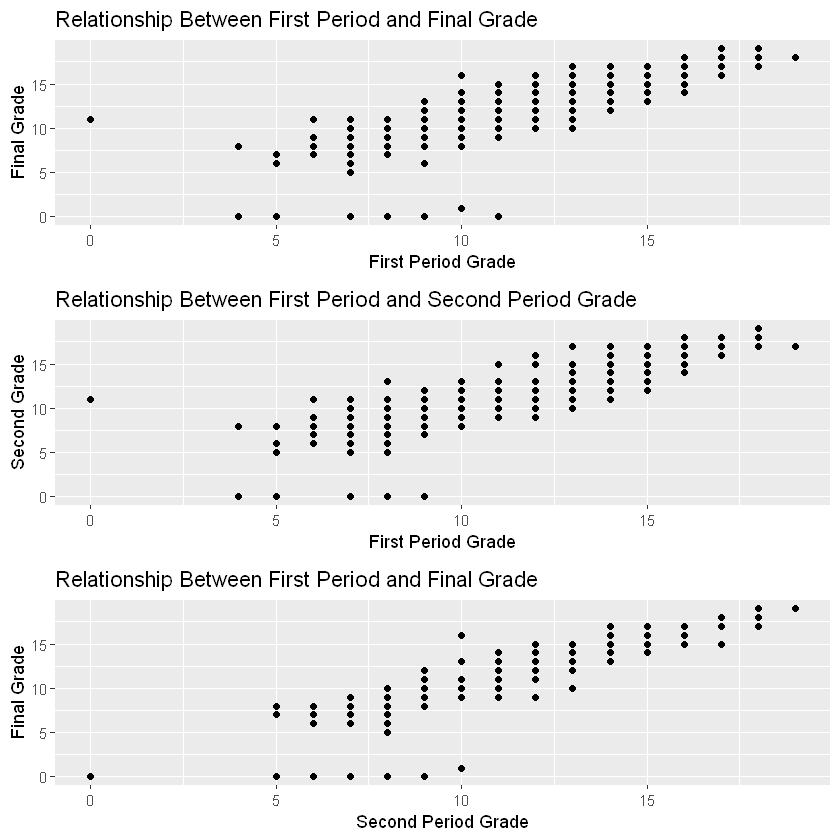

In [57]:
g1g3a<-ggplot(sp, aes(x=G1, y=G3))+
        geom_point()+
        ggtitle("Relationship Between First Period and Final Grade")+
        xlab("First Period Grade")+
        ylab("Final Grade")
g1g2a<-ggplot(sp, aes(x=G1, y=G2))+
        geom_point()+
        ggtitle("Relationship Between First Period and Second Period Grade")+
        xlab("First Period Grade")+
        ylab("Second Grade")

g2g3a<-ggplot(sp, aes(x=G2, y=G3))+
        geom_point()+
        ggtitle("Relationship Between First Period and Final Grade")+
        xlab("Second Period Grade")+
        ylab("Final Grade")
grid.arrange(g1g3a,g1g2a,g2g3a, nrow=3)

In [58]:
cor.test(sm$G1,
         sm$G3,
         method = "spearman")

cor.test(sm$G1,
         sm$G2,
         method = "spearman")


cor.test(sm$G3,
         sm$G2,
         method = "spearman")

Warning message in cor.test.default(sm$G1, sm$G3, method = "spearman"):
"Cannot compute exact p-value with ties"


	Spearman's rank correlation rho

data:  sm$G1 and sm$G3
S = 1253119, p-value < 2.2e-16
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.8780013 


Warning message in cor.test.default(sm$G1, sm$G2, method = "spearman"):
"Cannot compute exact p-value with ties"


	Spearman's rank correlation rho

data:  sm$G1 and sm$G2
S = 1080656, p-value < 2.2e-16
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.8947916 


Warning message in cor.test.default(sm$G3, sm$G2, method = "spearman"):
"Cannot compute exact p-value with ties"


	Spearman's rank correlation rho

data:  sm$G3 and sm$G2
S = 440391, p-value < 2.2e-16
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.9571253 


In [59]:
cor.test(sp$G1,
         sp$G3,
         method = "spearman")

cor.test(sp$G1,
         sp$G2,
         method = "spearman")


cor.test(sp$G3,
         sp$G2,
         method = "spearman")

Warning message in cor.test.default(sp$G1, sp$G3, method = "spearman"):
"Cannot compute exact p-value with ties"


	Spearman's rank correlation rho

data:  sp$G1 and sp$G3
S = 5317392, p-value < 2.2e-16
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.8832876 


Warning message in cor.test.default(sp$G1, sp$G2, method = "spearman"):
"Cannot compute exact p-value with ties"


	Spearman's rank correlation rho

data:  sp$G1 and sp$G2
S = 4871943, p-value < 2.2e-16
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.8930649 


Warning message in cor.test.default(sp$G3, sp$G2, method = "spearman"):
"Cannot compute exact p-value with ties"


	Spearman's rank correlation rho

data:  sp$G3 and sp$G2
S = 2530793, p-value < 2.2e-16
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.9444512 


Izuzetno visoka korelacija u svim slučajevima. 

- Međutim  kod portugalskog najviša je korelacija  0.945 između ocene iz 2. i 3. perioda

- Kod matematike najviša je korelacija  0.957 takođe između ocene iz 2. i 3. perioda.

                                     Istraživačko pitanje:

            - Da li postoji razlika u nivou potrošnje alkohola između onih 

                                     koji planiraju i 

                         onih koji ne planiraju da nastave obrazovanje?

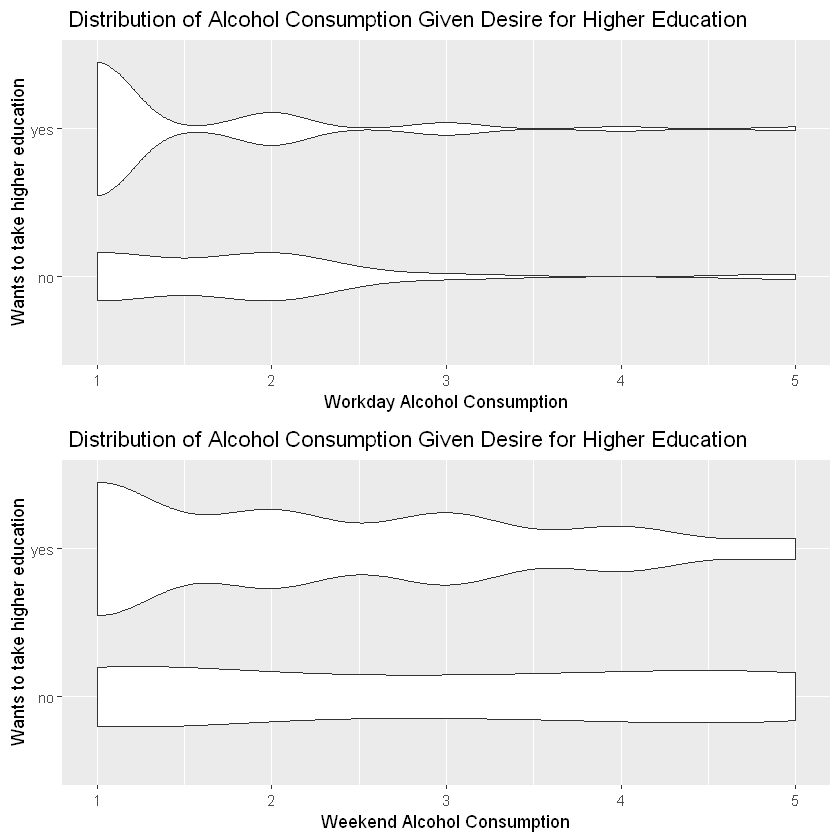

In [60]:
hghd<- ggplot(sm,aes(higher,Dalc))+
                geom_violin()+coord_flip()+
                xlab("Wants to take higher education")+
                ylab("Workday Alcohol Consumption")+
                ggtitle(" Distribution of Alcohol Consumption Given Desire for Higher Education")




hghw<- ggplot(sm,aes(higher,Walc))+
                geom_violin()+coord_flip()+
                xlab("Wants to take higher education")+
                ylab("Weekend Alcohol Consumption")+
                ggtitle(" Distribution of Alcohol Consumption Given Desire for Higher Education")

grid.arrange(hghd,hghw,nrow=2)

- Ovaj violinski plot prikazuje raspodelu nivoa potrošnje alkohola radnim danom s obzirom na želju studenata za višim obrazovanjem.


- Veća je distribucija ljudi u grupi sa vrlo niskom konzumacijom alkohola (Workday Alcohol Consumption=1) koji žele visoko obrazovanje od onih koji ne žele visoko obrazovanje. Ovaj rezultat se poklapa sa očekivanjima.

- Raspon nivoa potrošnje alkohola vikendom kod onih koji konzumiraju veće količine alkohola izraženiji je kod onij koji ne planiraju više obrazovanje, dok se takođe vidi da su oni koji imaju nizak nivou potrošnje alkohola veoma brojni i generalno brojniji od istih među onima koji ne žele da nastave dalje obrazovanje
    

Funkcija ggplot je korišćena za stvaranje violine plot-a.

x osa je  bila želja za visokim obrazovanjem, a y osa nivo potrošnje alkohola.

Zatim sam obrnula koordinatnu osu da bih mogla lakše da uporedim raspodele.


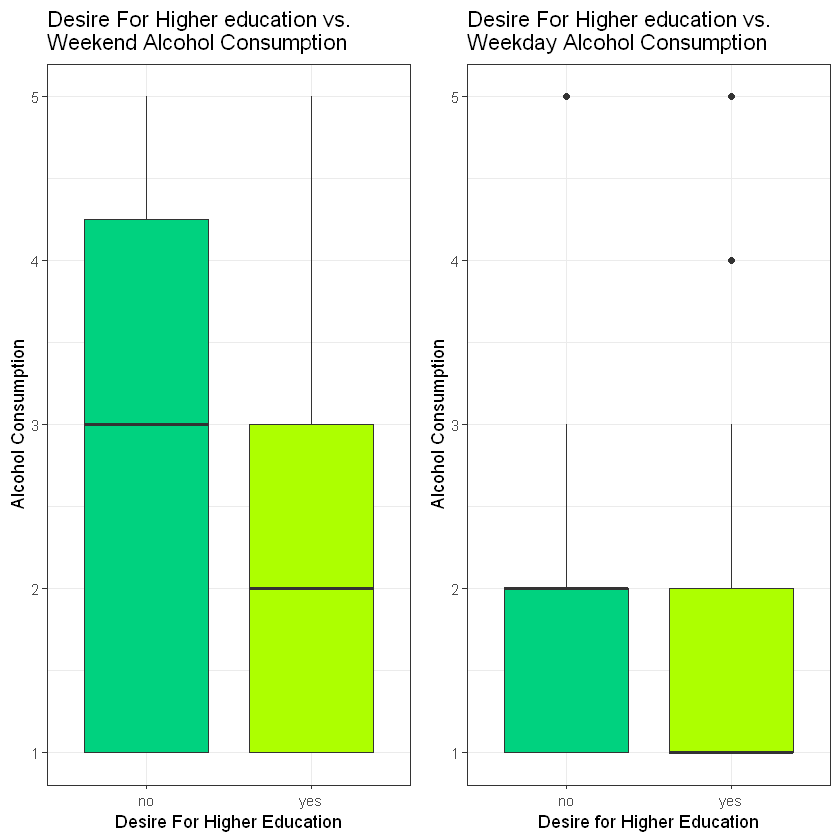

In [61]:

waffle.col <- c("#00d27f","#adff00","#f9d62e","#fc913a","#ff4e50")

waw<-ggplot(sm, aes(higher,Walc, fill=higher))+ 
        geom_boxplot()+ 
        theme_bw()+ 
        theme(legend.position="none")+ 
        scale_fill_manual(values=waffle.col)+ 
        xlab("Desire For Higher Education")+ 
        ylab("Alcohol Consumption")+        
        ggtitle("Desire For Higher education vs.\nWeekend Alcohol Consumption ") 
daw<-ggplot(sm, aes(higher,Dalc, fill=higher))+ 
            geom_boxplot()+ 
            theme_bw()+ 
            theme(legend.position="none")+ 
            scale_fill_manual(values=waffle.col)+ 
            xlab("Desire for Higher Education")+ 
            ylab("Alcohol Consumption")+ 
            ggtitle("Desire For Higher education vs.\nWeekday Alcohol Consumption") 



grid.arrange(waw,daw,ncol=2) 


Napravila sam i dva  boks plota jedan uz drugi.(Koristila sam grid.arrange da spojimo dva skupa podataka zajedno)

* Sada možemo videti da je opseg jednak za potrošnju alkohola radnim danom (između 1-2) uzimajući u obzir želju za visokim obrazovanjem. *

* Međutim, tokom konzumacije alkohola vikendom opseg potrošnje alkohola je veći u slučaju da ne postoji želja za visokim obrazovanjem (1-4,7) u poređenju sa onima koji žele visoko obrazovanje 
(1-3).

Prosečna potrošnja alkohola veća je za ljude koji ne žele visoko obrazovanje(3) od onih koji žele(2) , onako kako bi se očekivalo. *


In [62]:
table(sm$Walc,sm$higher)
table(sm$Dalc, sm$higher)
chisq.test(table(sm$Walc,sm$higher))
chisq.test(table(sm$Dalc, sm$higher))

   
     no yes
  1   7 144
  2   2  83
  3   3  77
  4   3  48
  5   5  23

   
     no yes
  1   9 267
  2   9  66
  3   1  25
  4   0   9
  5   1   8

Warning message in chisq.test(table(sm$Walc, sm$higher)):
"Chi-squared approximation may be incorrect"


	Pearson's Chi-squared test

data:  table(sm$Walc, sm$higher)
X-squared = 11.249, df = 4, p-value = 0.0239


Warning message in chisq.test(table(sm$Dalc, sm$higher)):
"Chi-squared approximation may be incorrect"


	Pearson's Chi-squared test

data:  table(sm$Dalc, sm$higher)
X-squared = 10.618, df = 4, p-value = 0.03121


               
              *Istraživačko pitanje: Da li se vreme učenja razlikuje prema polu?*
                                 Ko uči više, dečaci ili devojčice?

In [63]:
studytime.factor<-factor(sm$studytime,
                     levels=c(1,2,3,4),
                     labels=c("1-2","2-5","5-10",">10"))


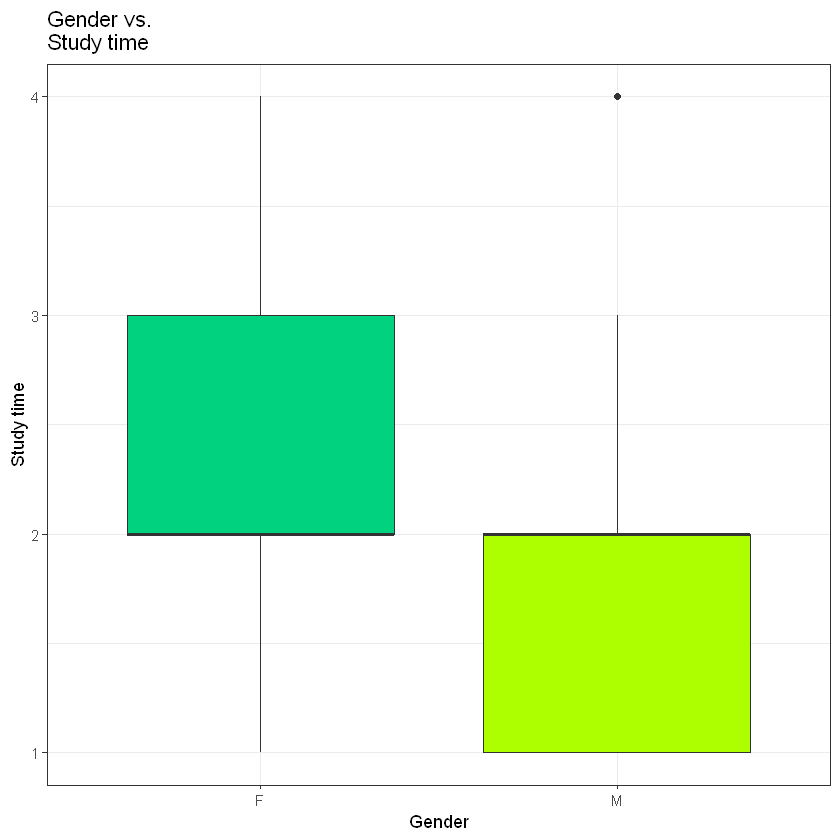

In [64]:
ggplot(sm, aes(sex,studytime, fill=sex))+ 
        geom_boxplot()+ 
        theme_bw()+ 
        theme(legend.position="none")+ 
        scale_fill_manual(values=waffle.col)+ 
        xlab("Gender")+ 
        ylab("Study time")+        
        ggtitle("Gender vs.\nStudy time ") 


In [65]:
table(studytime.factor, sm$sex)

chisq.test(table(studytime.factor, sm$sex))


                
studytime.factor   F   M
            1-2   27  78
            2-5  113  85
            5-10  51  14
            >10   17  10


	Pearson's Chi-squared test

data:  table(studytime.factor, sm$sex)
X-squared = 50.634, df = 3, p-value = 5.854e-11


P-value =5.854e-11  -> manje od 0.05 što implicira da odbacujemo Ho *nultu hipotezu*  koja tvrdi da su ove dve varijable nezavisne, i da ne postoji statistički značajna razlika u vremenu koje provode učeći dečaci i devojčice.

Stoga možemo reći da postoji *zavisnost izmedju pola i vremena provedenog učeći*.

Više uče devojčice u mom slučaju, kada koristim prvi dataset.

                                  Istraživačko pitanje:
      - Da li vreme učenja varira u zavisnosti od ljubavnog statusa?(U vezi/nije u vezi)

             - Ko više uči, oni u vezi ili oni koji nemaju partnera?

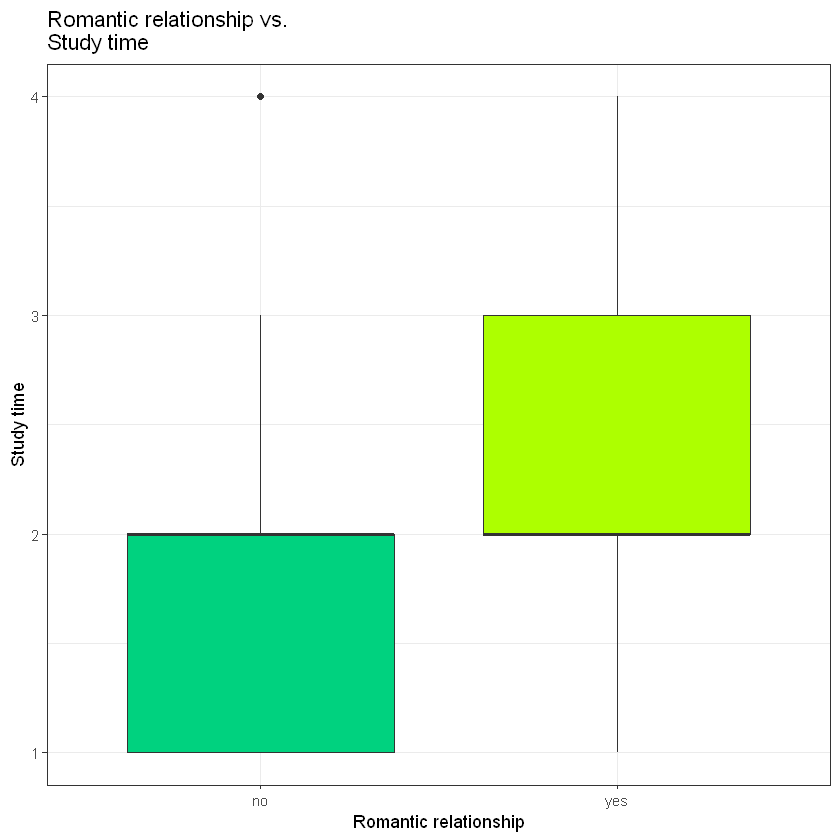

In [95]:
ggplot(sm, aes(romantic, studytime, fill=romantic))+ 
        geom_boxplot()+ 
        theme_bw()+ 
        theme(legend.position="none")+ 
        scale_fill_manual(values=waffle.col)+ 
        xlab("Romantic relationship")+ 
        ylab("Study time")+        
        ggtitle("Romantic relationship vs.\nStudy time ") 



In [67]:

table(studytime.factor, sm$romantic)
chisq.test(table(studytime.factor, sm$romantic))


                
studytime.factor  no yes
            1-2   79  26
            2-5  126  72
            5-10  36  29
            >10   22   5


	Pearson's Chi-squared test

data:  table(studytime.factor, sm$romantic)
X-squared = 10.665, df = 3, p-value = 0.01368


 P-value = 0.01368 što je manje od 0.05 što implicira da odbacujemo nultu hipotezu Ho koja tvrdi da su ove dve varijable nezavisne. 
 
 Stoga možemo reći da postoji zavisnost izmedju partnerskog statusa učenika(u vezi, nisu u vezi) i vremena provedenog učeći.  
 
 Zanimljivo je da možemo da vidimo da duže uče oni koji su u vezi, nego oni koji nisu.


                                          Istraživačko pitanje:

        - Da li vreme učenja varira u zavisnosti od dodatno plaćenih časova matematike?
                                                    (yes/no)

                     - Ko više uči, oni koji idu na dodatne časove ili oni koji ne idu?


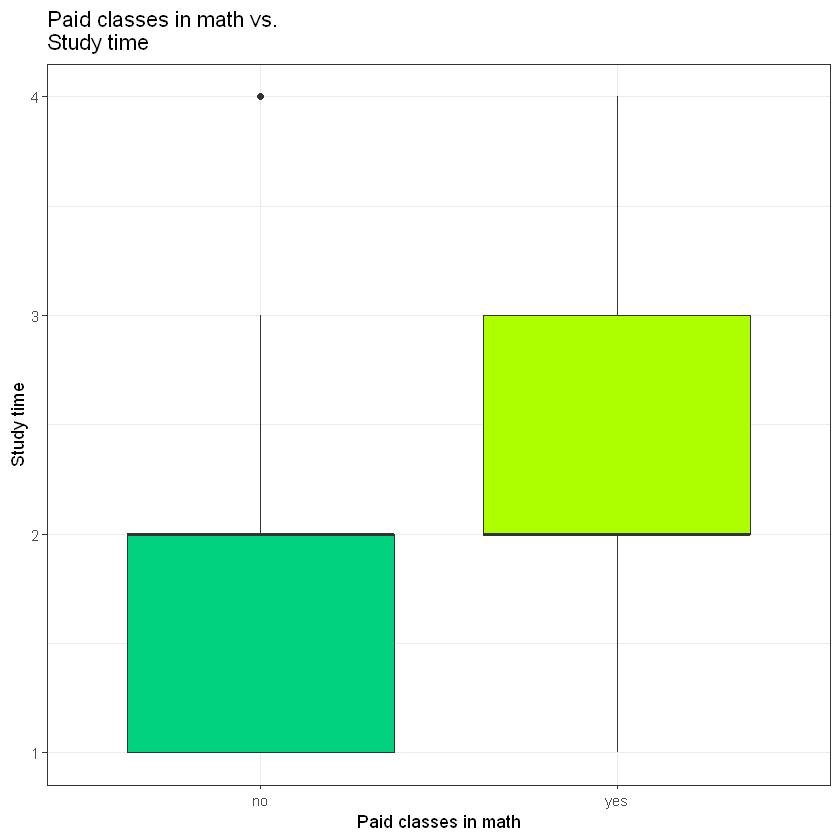

In [68]:
waffle.col <- c("#00d27f","#adff00","#f9d62e","#fc913a","#ff4e50")

ggplot(sm, aes(paid,studytime, fill=paid))+ 
        geom_boxplot()+ 
        theme_bw()+ 
        theme(legend.position="none")+ 
        scale_fill_manual(values=waffle.col)+ 
        xlab("Paid classes in math")+ 
        ylab("Study time")+        
        ggtitle("Paid classes in math vs.\nStudy time ") 


In [69]:
table(studytime.factor, sm$paid)
chisq.test(table(studytime.factor, sm$paid))



                
studytime.factor no yes
            1-2  73  32
            2-5  99  99
            5-10 31  34
            >10  11  16


	Pearson's Chi-squared test

data:  table(studytime.factor, sm$paid)
X-squared = 14.418, df = 3, p-value = 0.002388


P-value =0.002388 što je manje od 0.05 i implicira da odbacujemo nultu hipotezu Ho koja tvrdi da su ove dve varijable nezavisne.

Stoga možemo reći da postoji zavisnost izmedju pohađanja dodatnih plaćenih časova i vremena provedenog učeći.

Zanimljivo je da možemo da vidimo da duže uče oni koji idu na dodatne časove, nego oni koji ne idu.

                                   Istraživačko pitanje:

    - Da li postoji razlika izmedju polova u učestalosti padanja matematike u prethodnim                                                godinama?

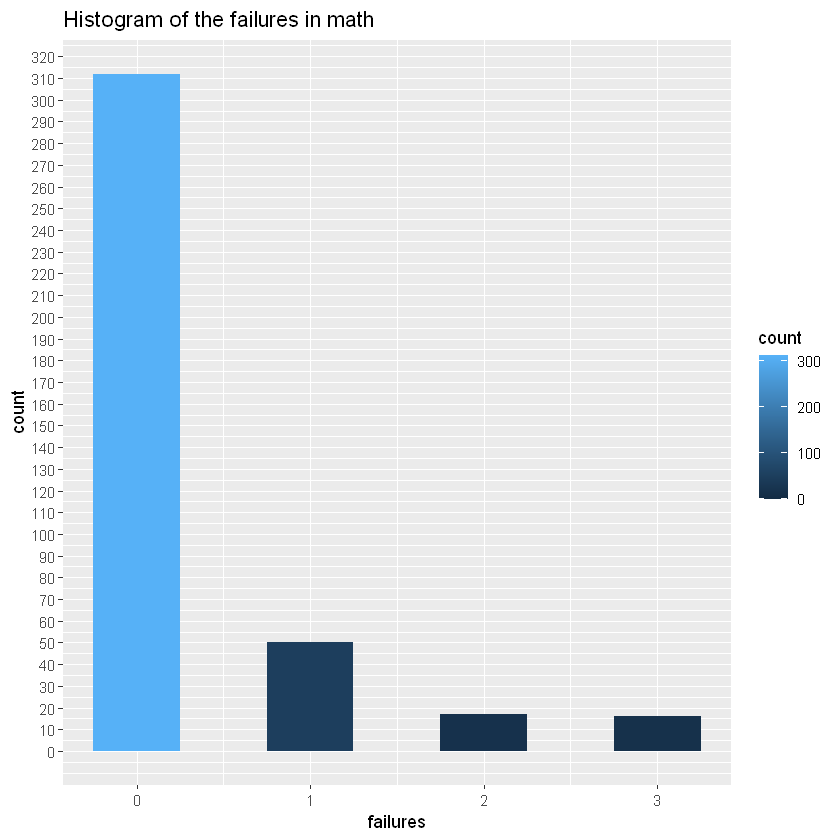

In [70]:
ggplot(sm, aes(x=failures)) + 
  geom_histogram(binwidth = 0.5, aes(fill = ..count..))+
  scale_x_continuous(breaks = seq(0,4,1))+
  scale_y_continuous(breaks = seq(0,395,10))+
  ggtitle("Histogram of the failures in math")

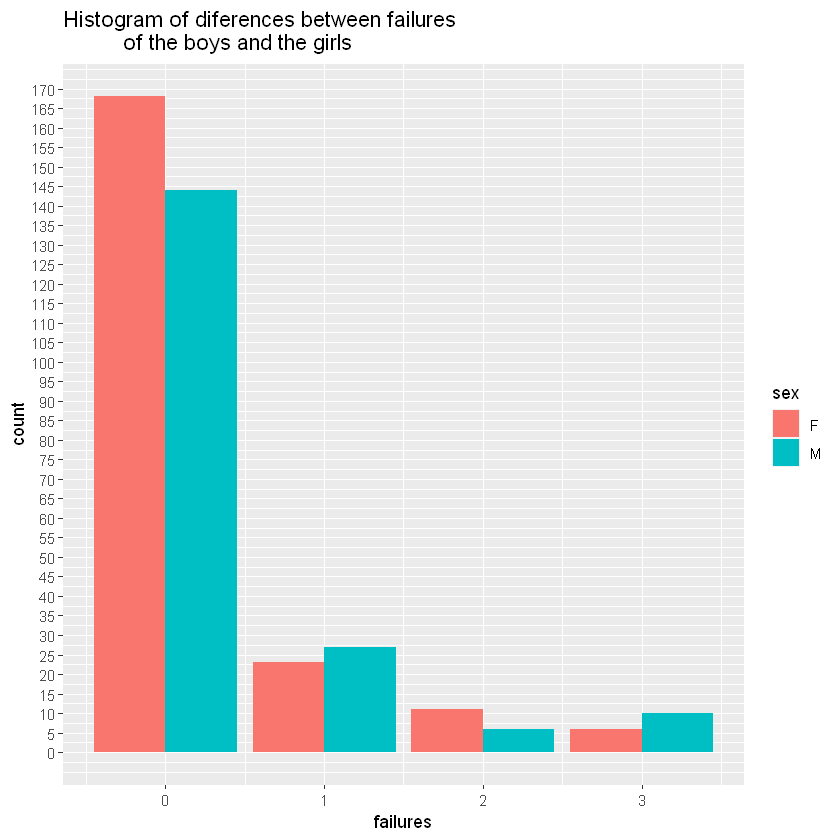

In [71]:
ggplot(data=sm, aes(x=failures, fill=sex))+
  geom_bar(stat="count",
           position="dodge",
           color="NA")+
  scale_x_continuous(breaks = seq(0,3,1))+
  scale_y_continuous(breaks = seq(0,170,5))+
  ggtitle("Histogram of diferences between failures\
          of the boys and the girls ")


In [72]:
table(sm$failures, sm$sex)


chisq.test(table(sm$failures, sm$sex))


   
      F   M
  0 168 144
  1  23  27
  2  11   6
  3   6  10


	Pearson's Chi-squared test

data:  table(sm$failures, sm$sex)
X-squared = 3.5303, df = 3, p-value = 0.3169


P-value =0.3169 što je više od 0.05 i implicira da ne odbacujemo nultu hipotezu Ho koja tvrdi da su ove dve varijable nezavisne.

Stoga možemo reći da ne postoji zavisnost izmedju frekventnossti padanja matematike i pola. 

                                    Istraživačko pitanje:

    - Da li postoji razlika izmedju onih u romantičnoj vezi i onih koji nisu u vezi 
    u učestalosti padanja matematike u prethodnim godinama?

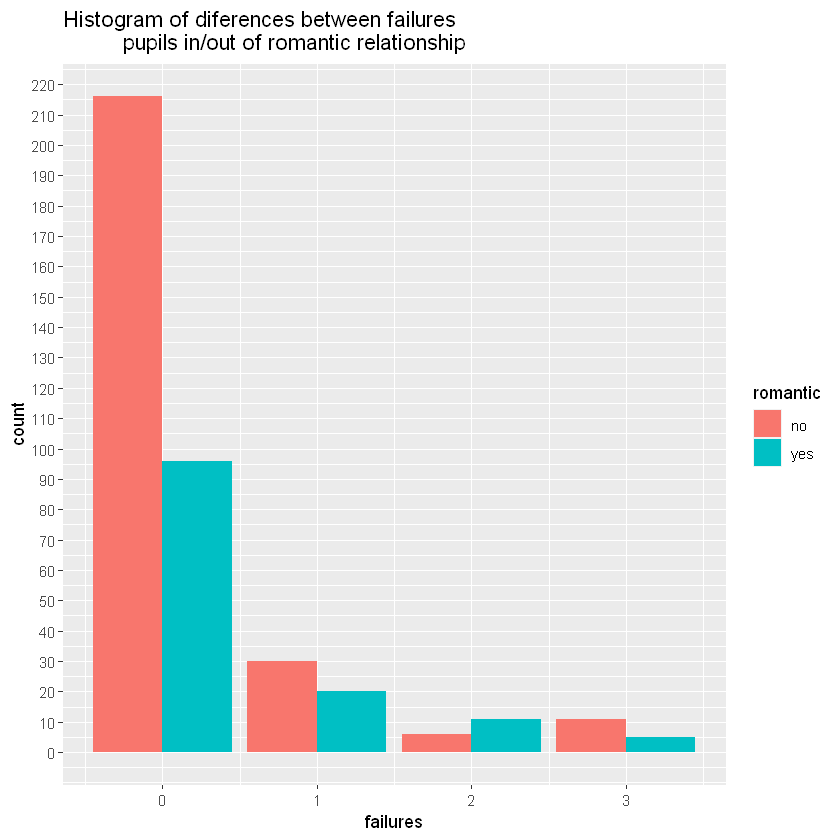

In [73]:
ggplot(data=sm, aes(x=failures, fill=romantic))+
  geom_bar(stat="count",
           position="dodge",
           color="NA")+
  scale_x_continuous(breaks = seq(0,3,1))+
  scale_y_continuous(breaks = seq(0,220,10))+
  ggtitle("Histogram of diferences between failures\
          pupils in/out of romantic relationship ")


In [74]:
chisq.test(table(sm$failures,sm$romantic))

table(sm$failures, sm$romantic)


	Pearson's Chi-squared test

data:  table(sm$failures, sm$romantic)
X-squared = 9.4705, df = 3, p-value = 0.02365


   
     no yes
  0 216  96
  1  30  20
  2   6  11
  3  11   5

P-value =0.02365 što je manje od 0.05 i implicira da  odbacujemo nultu hipotezu Ho koja tvrdi da su ove dve varijable nezavisne.

Stoga možemo reći da postoji zavisnost izmedju frekventnossti padanja matematike i romantičnog statusa(U vezi/Nije u vezi). Ne bih se dalje usudila da tumačim podatke jer grupa ljudi koja se razlikuje prema romantičnom statusu nije usklađena brojčano. Mnogo je više onih koji nisu u vezi.


                                       Istraživačko pitanje:

**Da li postoji veza između pola i daljeg nastavka obrazovanja?**

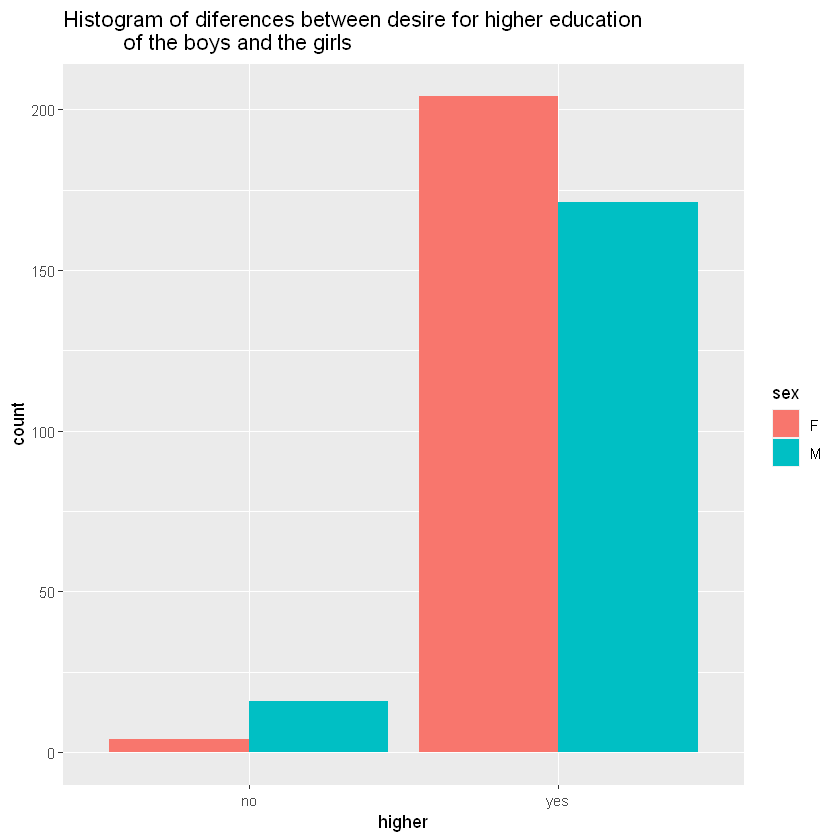

In [82]:
ggplot(data=sm, aes(x=higher, fill=sex))+
  geom_bar(stat="count",
           position="dodge",
           color="NA")+
  ggtitle("Histogram of diferences between desire for higher education\
          of the boys and the girls ")




In [83]:
table(sm$higher, sm$sex)
chisq.test(table(sm$higher, sm$sex))

     
        F   M
  no    4  16
  yes 204 171


	Pearson's Chi-squared test with Yates' continuity correction

data:  table(sm$higher, sm$sex)
X-squared = 7.6859, df = 1, p-value = 0.005565


Da li postoji veza između pola i daljeg nastavka obrazovanja?

Izgleda da veza postoji te da možemo odbaciti Ho i potvrditi H1 - alternativnu hipotezu prema kojoj postoji razlika između polova kada je u pitanju želja za visokim obrazovanjem.

Na osnovu Bar charta vidimo da je u uvom uzorku i vremenskom trenutku rezultat pokazao da više žena nego muškaraca planira da nastavi obrazovanje, a da više muškaraca planira da ne nastavi obrazovanje i to čak 4 puta više muškaraca nego žena.

Odnos muškaraca i žena u uzorku je dovoljno usklađen F=208, M=187.

      F   M
no    4  16
yes 204 171

                                        Istraživačko pitanje:

**Da li postoji razlika između dece sa sela(R) i dece iz grada(U) kad je u pitanju dalji nastavak obrazovanja?**

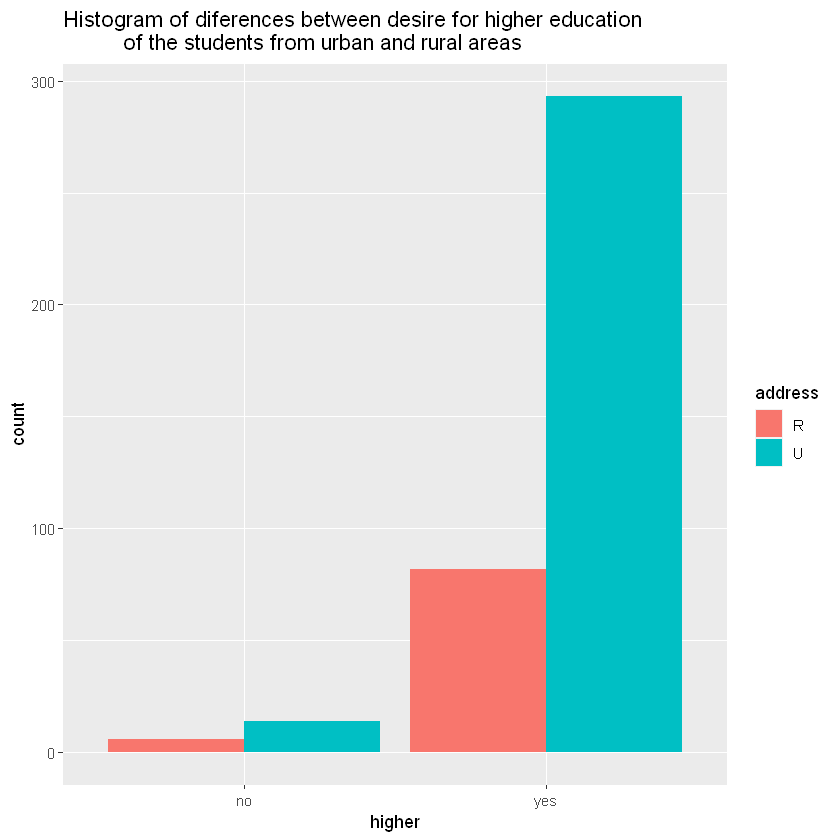

In [86]:
ggplot(data=sm, aes(x=higher, fill=address))+
  geom_bar(stat="count",
           position="dodge",
           color="NA")+
  ggtitle("Histogram of diferences between desire for higher education\
          of the students from urban and rural areas ")



In [84]:
    table(sm$higher,sm$address)
chisq.test(table(sm$higher,sm$addres))

     
        R   U
  no    6  14
  yes  82 293

Warning message in chisq.test(table(sm$higher, sm$addres)):
"Chi-squared approximation may be incorrect"


	Pearson's Chi-squared test with Yates' continuity correction

data:  table(sm$higher, sm$addres)
X-squared = 0.33171, df = 1, p-value = 0.5647


Da li postoji razlika između dece sa sela(R) i dece iz grada(U) kad je u pitanju dalji nastavak obrazovanja?

Nema statistički značajne razlike, što sam negde lično i očekivala, ali ne može se nešto dublje o ovom govoriti jer u ovom uzorko odnos dece sa sela i iz grada nije usklađen.

                                   Istraživačka pitanje:

- Da li postoji razlika u broju odsustava iz škole u zavisnosti od nivoa potrošnje alkohola u toku radne nedelje?

- Da li postoji razlika u broju odsustava iz škole u zavisnosti od nivoa potrošnje alkohola  tokom vikenda?



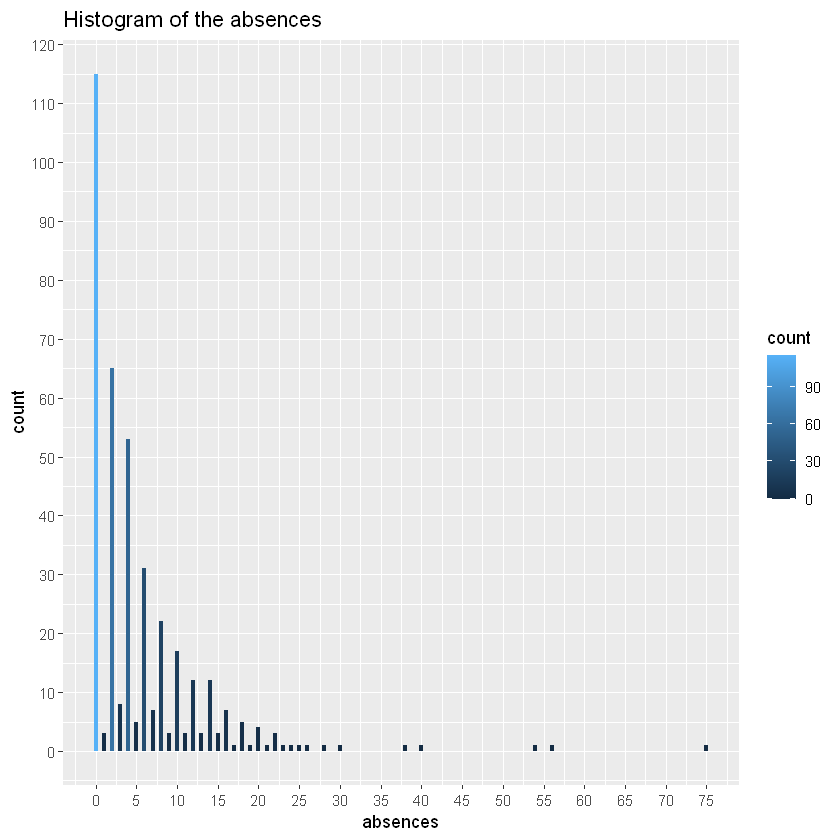

In [87]:
ggplot(sm, aes(x=absences)) + 
  geom_histogram(binwidth = 0.5, aes(fill = ..count..))+
  scale_x_continuous(breaks = seq(0,80,5))+
  scale_y_continuous(breaks = seq(0,120,10))+
  ggtitle("Histogram of the absences")

In [88]:
sm$Dalc <- as.factor(sm$Dalc) 
sm$Dalc <- mapvalues(sm$Dalc, 
                     from = 1:5, 
                     to = c("Very Low", "Low", "Medium", "High", "Very High"))

sm$Walc <- as.factor(sm$Walc)      
sm$Walc <- mapvalues(sm$Walc, 
                    from = 1:5, 
                    to = c("Very Low", "Low", "Medium", "High", "Very High"))

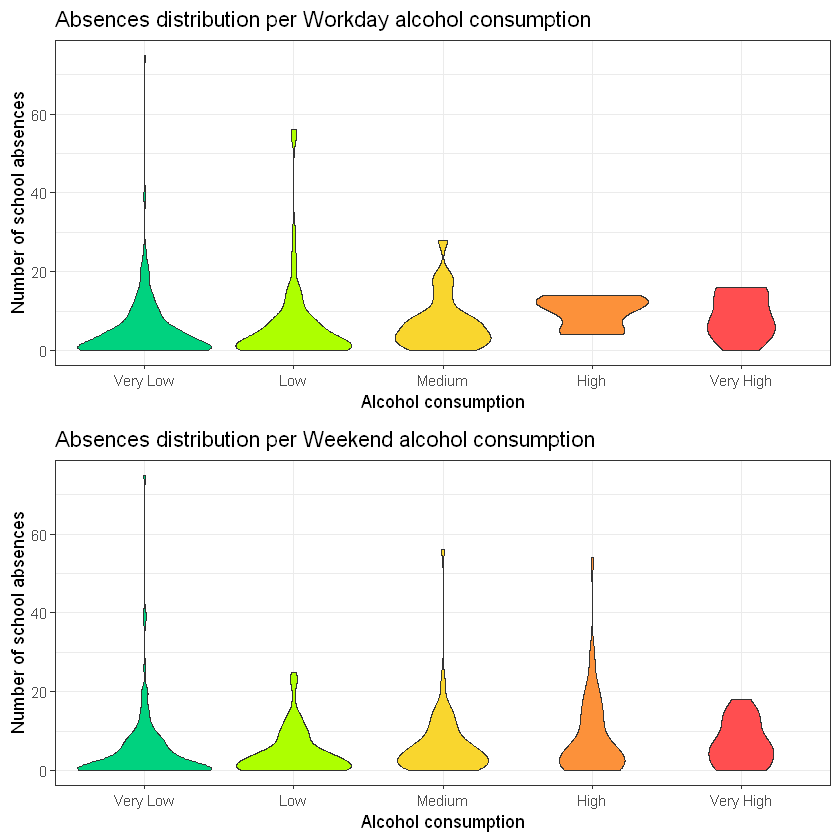

In [89]:
abs<-ggplot(sm, aes(x=Dalc, y=absences, fill=Dalc))+
      geom_violin()+
      scale_fill_manual(values = waffle.col)+
      theme_bw()+
      theme(legend.position="none")+
      ggtitle("Absences distribution per Workday alcohol consumption")+
      xlab("Alcohol consumption")+
      ylab("Number of school absences")
absw<-ggplot(sm, aes(x=Walc, y=absences, fill=Walc))+
      geom_violin()+
      scale_fill_manual(values = waffle.col)+
      theme_bw()+
      theme(legend.position="none")+
      ggtitle("Absences distribution per Weekend alcohol consumption")+
      xlab("Alcohol consumption")+
      ylab("Number of school absences")
grid.arrange(abs,absw, nrow=2)

In [90]:
table(sm$absences,sm$Walc)
table(sm$absences,sm$Dalc)
kruskal.test(sm$absences~sm$Walc)
kruskal.test(sm$absences~sm$Dalc)

    
     Very Low Low Medium High Very High
  0        58  26     14   11         6
  1         2   0      1    0         0
  2        26  17     14    7         1
  3         0   3      2    2         1
  4        18  11     12    8         4
  5         0   3      2    0         0
  6        11   4      8    4         4
  7         3   1      3    0         0
  8         9   4      4    2         3
  9         2   1      0    0         0
  10        5   5      5    1         1
  11        0   0      1    1         1
  12        4   3      3    1         1
  13        0   0      0    2         1
  14        2   3      4    1         2
  15        1   0      1    1         0
  16        2   0      1    2         2
  17        0   0      1    0         0
  18        1   1      1    1         1
  19        0   0      0    1         0
  20        3   0      0    1         0
  21        0   0      1    0         0
  22        0   1      0    2         0
  23        0   1      0    0      

    
     Very Low Low Medium High Very High
  0        86  24      4    0         1
  1         2   1      0    0         0
  2        50  12      3    0         0
  3         1   4      3    0         0
  4        41   6      2    2         2
  5         2   2      1    0         0
  6        22   4      3    1         1
  7         4   3      0    0         0
  8        12   5      4    0         1
  9         3   0      0    0         0
  10       12   2      1    1         1
  11        2   0      0    1         0
  12        9   2      0    1         0
  13        0   1      1    1         0
  14        8   1      0    2         1
  15        1   1      1    0         0
  16        4   1      0    0         2
  17        0   1      0    0         0
  18        4   0      1    0         0
  19        0   0      1    0         0
  20        4   0      0    0         0
  21        1   0      0    0         0
  22        2   1      0    0         0
  23        1   0      0    0      


	Kruskal-Wallis rank sum test

data:  sm$absences by sm$Walc
Kruskal-Wallis chi-squared = 18.263, df = 4, p-value = 0.001096



	Kruskal-Wallis rank sum test

data:  sm$absences by sm$Dalc
Kruskal-Wallis chi-squared = 16.446, df = 4, p-value = 0.002475


- Ho Da li postoji razlika u broju odsustava iz škole u zavisnosti od nivoa potrošnje alkohola u toku radne nedelje?

- H1 Da li postoji razlika u broju odsustava iz škole u zavisnosti od nivoa potrošnje alkohola  tokom vikenda?

Koristila sam Kruskal Wallis test jer odsustva studenata ni približno nemaju normalno raspodelu te je ovaj neparametarski test, pri tome imam jednu kontinualnu varijablu broj odsustava i jednu kategorijalnu varijablu, nivo potrošnje alkohola vikendom/radnim danima.


    Kruskal-Wallis Test Oneway ANOVA by ranks

kruskal.test(y~a)

    gde je y numerička vrednsot
    i a je faktor




Za vikend vrenost je:

p-value = 0.001096

Odbacujemo Ho

Što znači da postoji razlika u broju odsustava iz škole u zavisnosti od nivoa potrošnje alkohola  tokom vikenda

Za radne dane vrednost je:

p-value= 0.002475

Odbacujemo Ho

Što znači da postoji razlika u broju odsustava iz škole u zavisnosti od nivoa potrošnje alkohola u toku radne nedelje


Ovo takođe lepo možemo uočiti kroz priloženu vizuelizaciju.
Lepo vidimo na violin plot-u kako je za one koji imaju nizak nivo potrošnje alkohola raspodela vrlo široka pri dnu i izraženo se sužava, dok se raspodela za one koje imaju vrlo visok nivo potrošnje alkohola ne sužava već ostaje izraženo zadebljana .

S tim da nema slučajeva sa veoma visokim brojem odsustava među onima koji imaju visok nivo kozumacije alkohola

     Korelacija između broja neuspeha u prošlosti i konačne ocene iz 
                             matematike/portugalskog
                                    ?

In [94]:

 cor.test(sm$failures,
         sm$G3,
         method = "spearman")


 cor.test(sp$failures,
         sp$G3,
         method = "spearman")




Warning message in cor.test.default(sm$failures, sm$G3, method = "spearman"):
"Cannot compute exact p-value with ties"


	Spearman's rank correlation rho

data:  sm$failures and sm$G3
S = 13981916, p-value = 1.282e-13
alternative hypothesis: true rho is not equal to 0
sample estimates:
       rho 
-0.3612235 


Warning message in cor.test.default(sp$failures, sp$G3, method = "spearman"):
"Cannot compute exact p-value with ties"


	Spearman's rank correlation rho

data:  sp$failures and sp$G3
S = 65987006, p-value < 2.2e-16
alternative hypothesis: true rho is not equal to 0
sample estimates:
       rho 
-0.4483603 


- Ho - Ne postoji  veza između, broja neuspeha u prošlosti i krajnje ocene iz matematike.
- H1 - Postoji  veza između, broja neuspeha u prošlosti i krajnje ocene iz  matematike.
 
 Možemo primetiti da postoji umerena negativna linearna veza između, broja neuspeha u prošlosti i krajnje ocene iz matematike.
 
 U suštini što je broj neuspeha u prošlosti veći to je ocena niža i obrnuto.
 
 Ne možemo ništa da govorimo o uzročno-posledičnoj vezi, možemo reći da veza postoji.
 
 vrednost za p-value = 1.282e-13, govori o značajnosti 
 
 a  rho = -0.3612235 da postoji umerena negativna linearna veza
 
U slučaju krajnje ocene iz portugalskog  

- Ho - Ne postoji  veza između, broja neuspeha u prošlosti i krajnje ocene iz portugalskog.
- H1 - Postoji  veza između, broja neuspeha u prošlosti i krajnje ocene iz portugalskog. 
 
 p-value < 2.2e-16 govori o značajnosti
 
 rho -0.4483603 takođe pokazuje umerenu negativnu linearnu vezu (za nijansu viša vrednost testa)

 Ne možemo ništa da govorimo o uzročno-posledičnoj vezi, možemo reći da veza postoji.
 